In [2]:
import datetime
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import statsmodels.api as sm
import warnings
from tqdm.notebook import tqdm
warnings.filterwarnings("ignore")
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set_theme(context='talk', style='whitegrid', palette='deep')
plt.rcParams['figure.figsize'] = 12, 8
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 25
plt.rcParams['figure.titlesize'] = 32
plt.rcParams['axes.titlesize'] = 32
plt.rcParams['savefig.format'] = 'pdf'
plt.rcParams['figure.autolayout'] = 'true'
plt.rcParams['figure.frameon'] = 'false'
plt.rcParams['axes.spines.left'] = 'false'
plt.rcParams['axes.spines.right'] = 'false'
plt.rcParams['axes.spines.top'] = 'false'
plt.rcParams['legend.fancybox'] = 'false'
plt.rcParams['axes.spines.bottom'] = 'false'
plt.rcParams['font.size'] = 20
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
# для графиков, где надо много цветов, юзайте воть:
sns.set_palette(sns.color_palette('deep'))
# а по дефолту воть:
sns.set_palette(sns.color_palette("BuGn_r", n_colors=10)[2::3])
pd.set_option('display.max_columns',60);
pd.set_option('display.float_format','{:,.6f}'.format)

In [3]:
df = pd.read_pickle("feeding_and_details.pkl")

In [4]:
monthly_feeding = pd.read_excel("datasets/Ekoniva_dataset.xlsx", sheet_name="Feeding (monthly)", header=1, skiprows=[2])
herd_metrics = pd.read_excel("datasets/Ekoniva_dataset.xlsx", sheet_name="Herd maintenance", header=1, skiprows=[2]).replace("-", np.nan)
production_indicators = pd.read_excel("datasets/Ekoniva_dataset.xlsx", sheet_name="Dairy indicators", header=1, skiprows=[2]).replace("-", np.nan)

<Axes: xlabel='RationPart', ylabel='Count'>

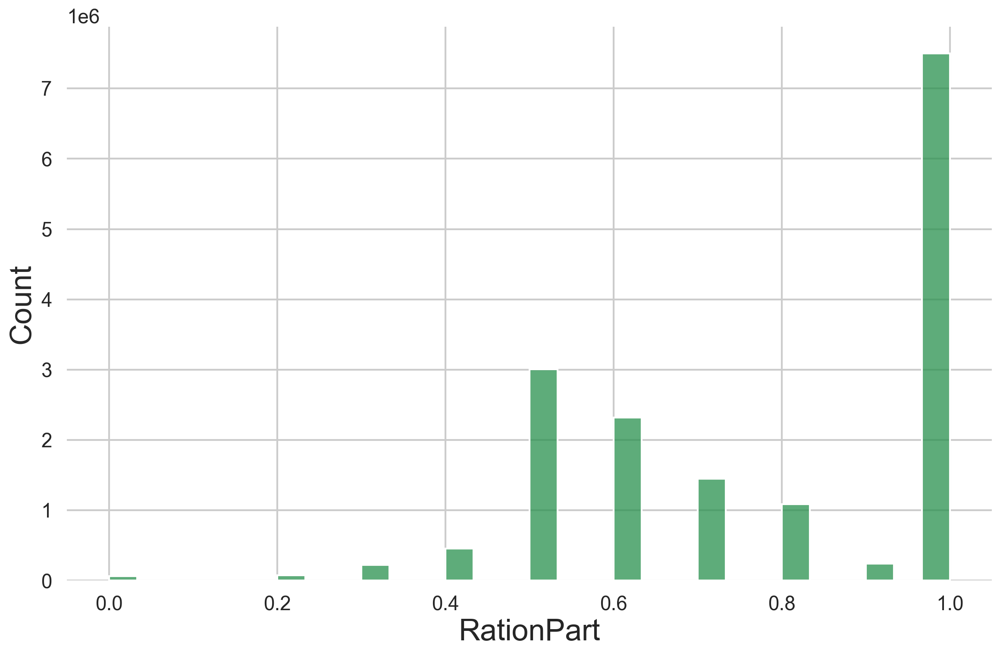

In [5]:
sns.histplot(df.RationPart, bins=30)

<Axes: xlabel='milk_cows', ylabel='bull_num'>

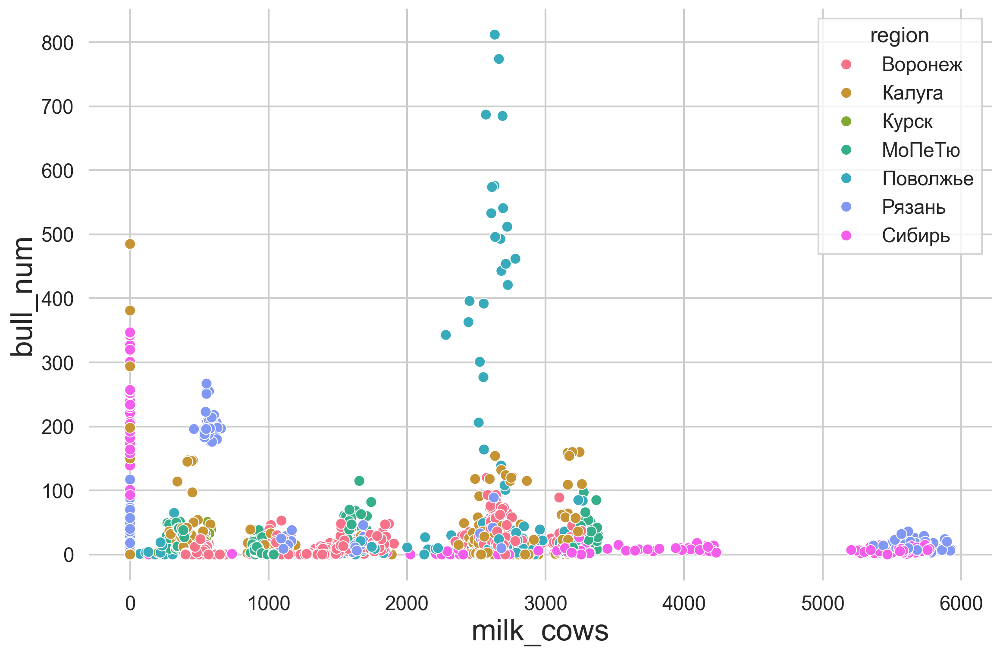

In [6]:
sns.scatterplot(data=production_indicators, x='milk_cows', y='bull_num', hue='region')

<Axes: xlabel='cow_retired_low_prod', ylabel='Count'>

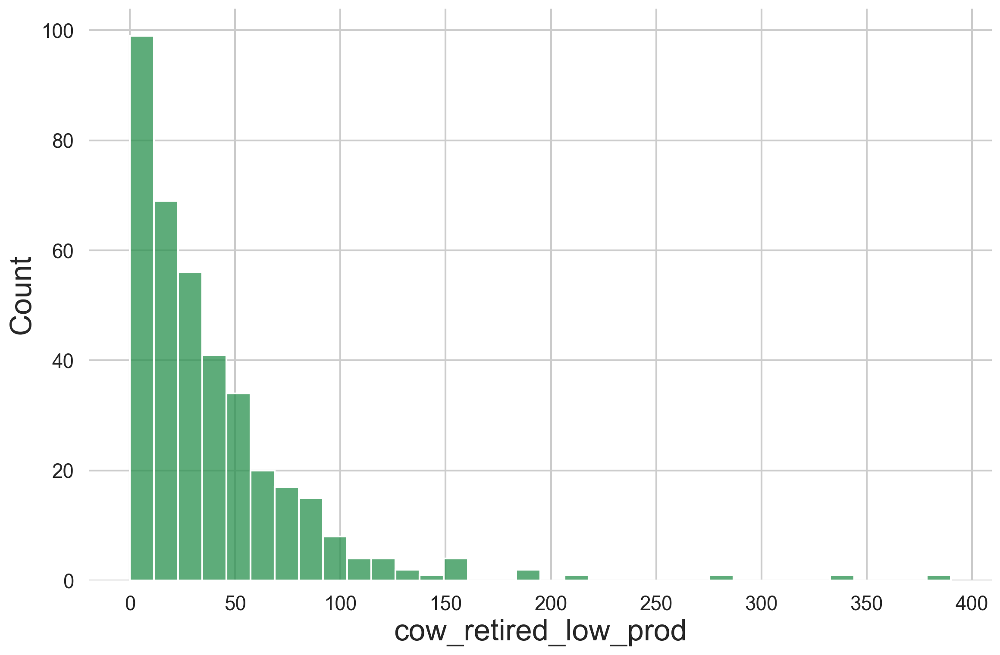

In [7]:
sns.histplot(production_indicators, x='cow_retired_low_prod')

<Axes: xlabel='milk_cows', ylabel='cow_retired_low_prod'>

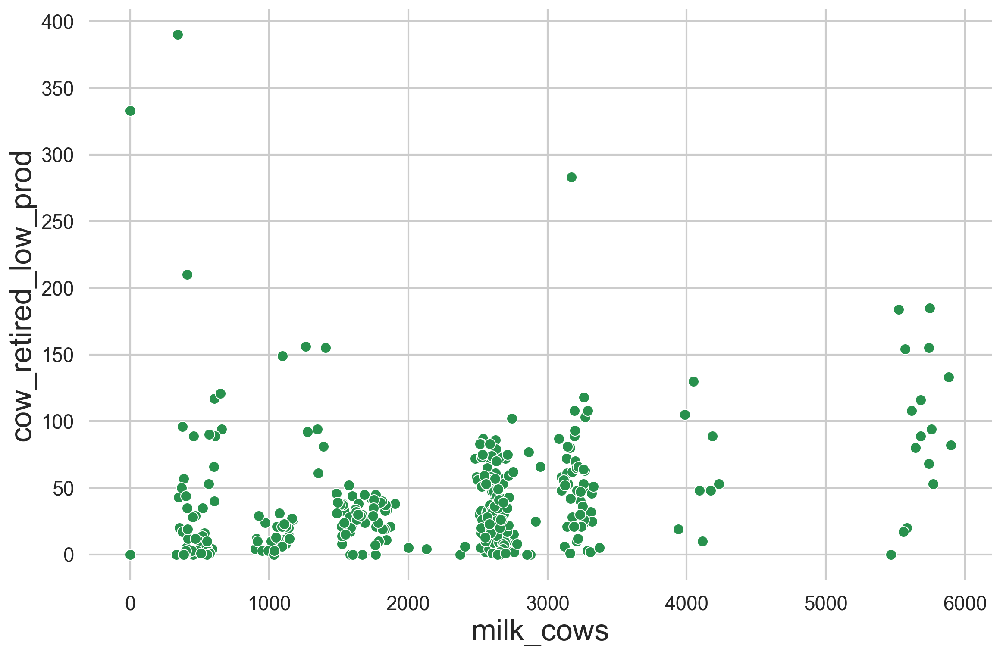

In [8]:
sns.scatterplot(data=production_indicators, x='milk_cows', y='cow_retired_low_prod')

<Axes: xlabel='bull_num', ylabel='cow_retired_low_prod'>

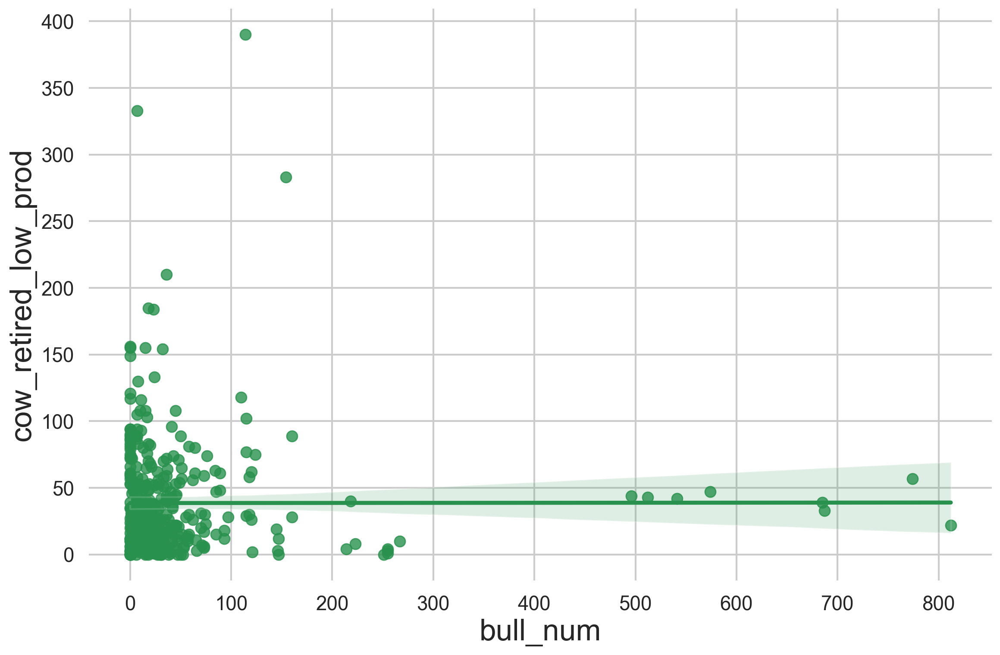

In [9]:
sns.regplot(data=production_indicators, x='bull_num', y='cow_retired_low_prod')

<Axes: xlabel='bull_num', ylabel='cow_retired'>

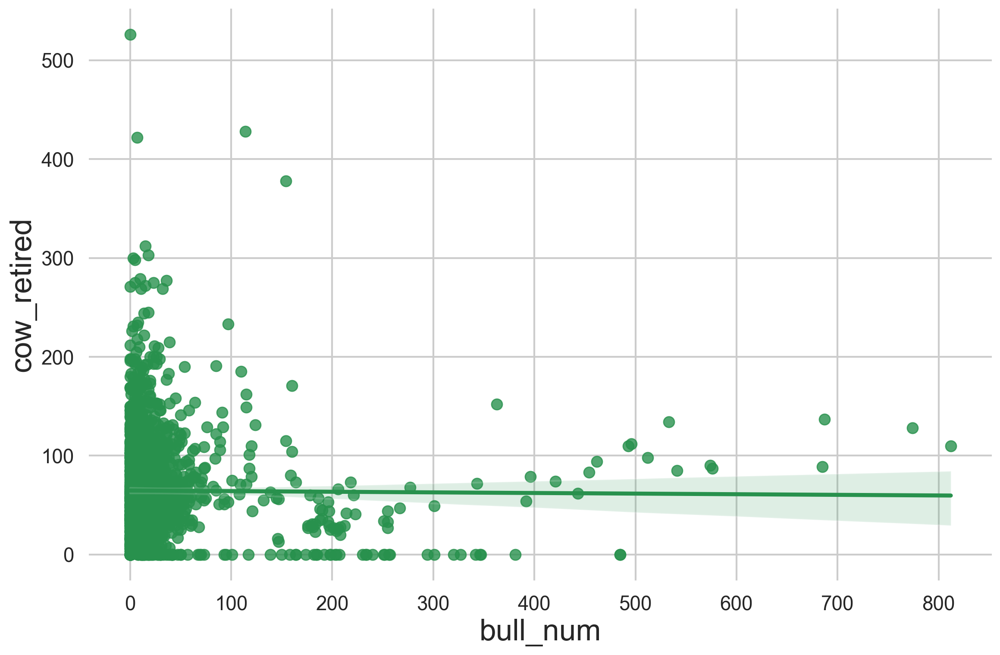

In [10]:
sns.regplot(data=production_indicators, x='bull_num', y='cow_retired')

<Axes: xlabel='weekly_milking_per_cow', ylabel='bull_num'>

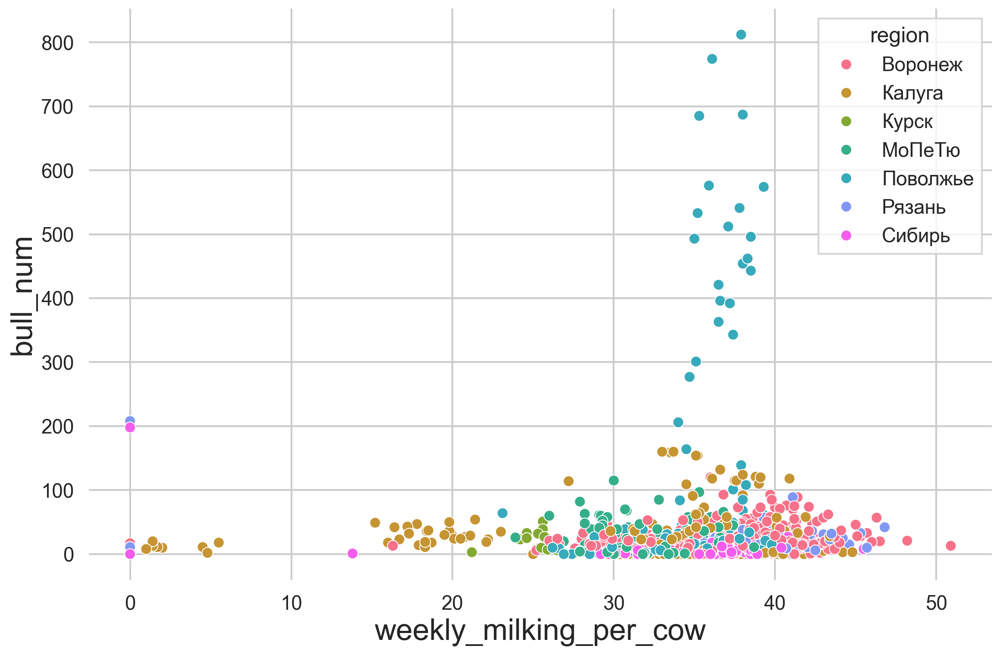

In [11]:
sns.scatterplot(data=production_indicators, x='weekly_milking_per_cow', y='bull_num', hue='region')

<Axes: xlabel='milk_cows', ylabel='bull_num'>

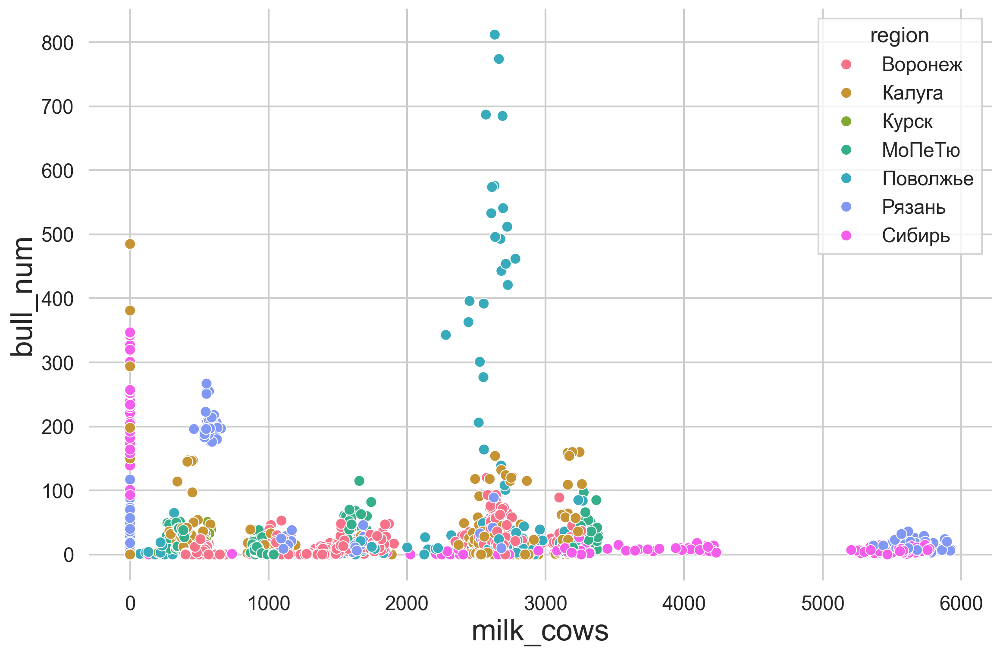

In [12]:
sns.scatterplot(data=production_indicators, x='milk_cows', y='bull_num', hue='region')

<Axes: xlabel='weekly_milking_per_cow', ylabel='gross_milk_yield'>

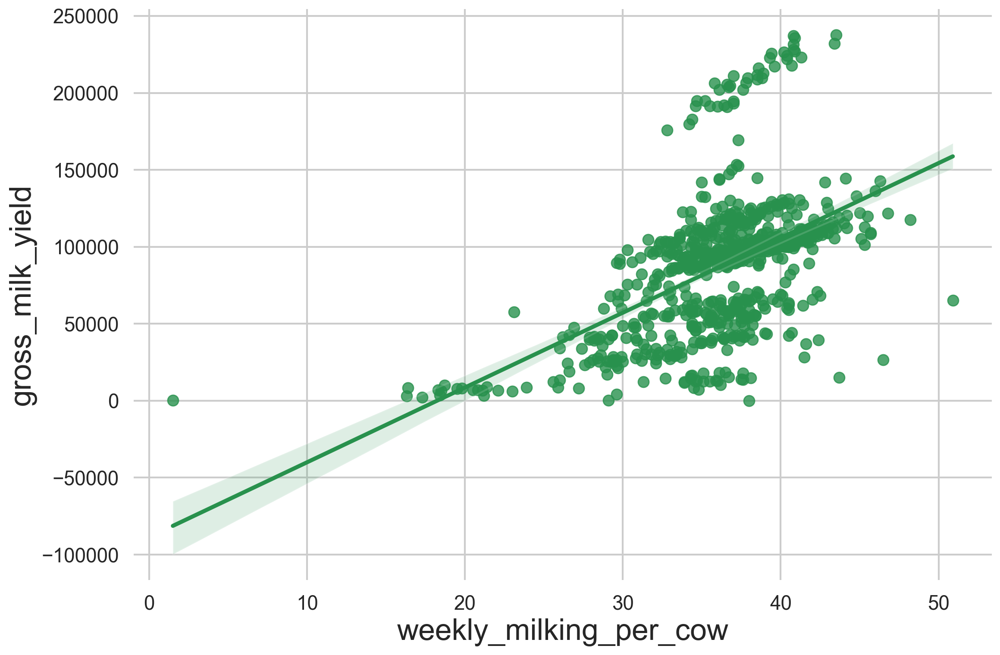

In [13]:
sns.regplot(data=production_indicators, x='weekly_milking_per_cow', y='gross_milk_yield')

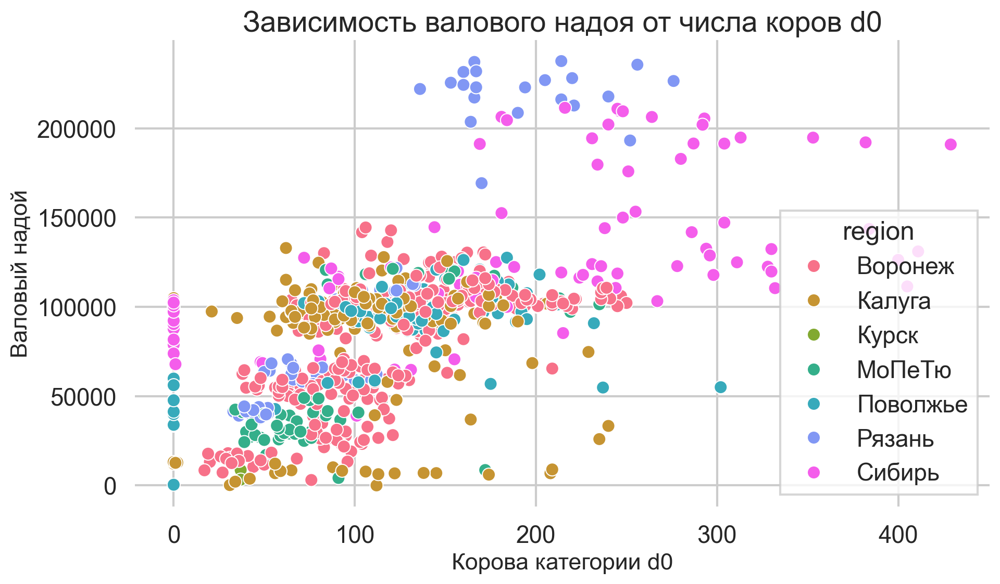

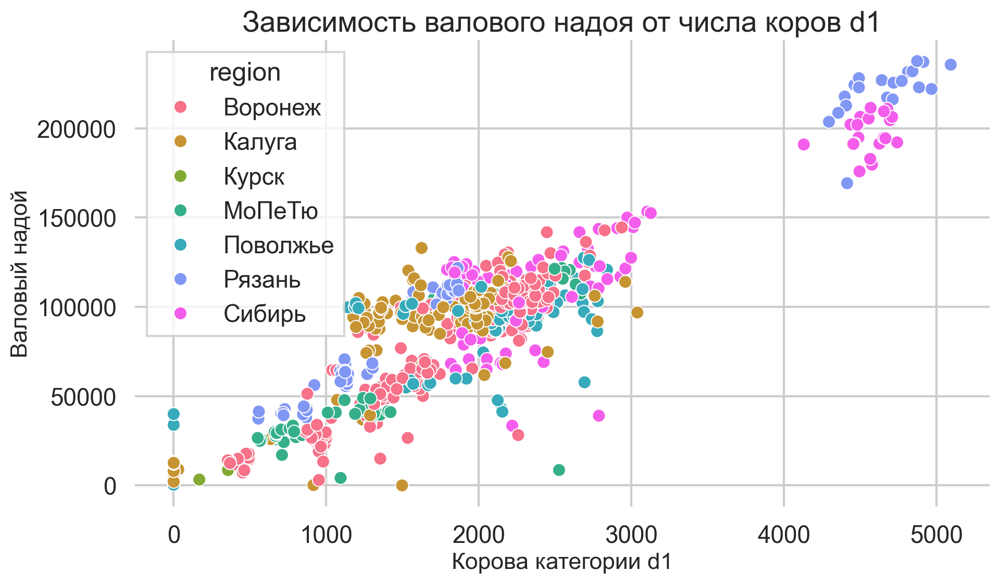

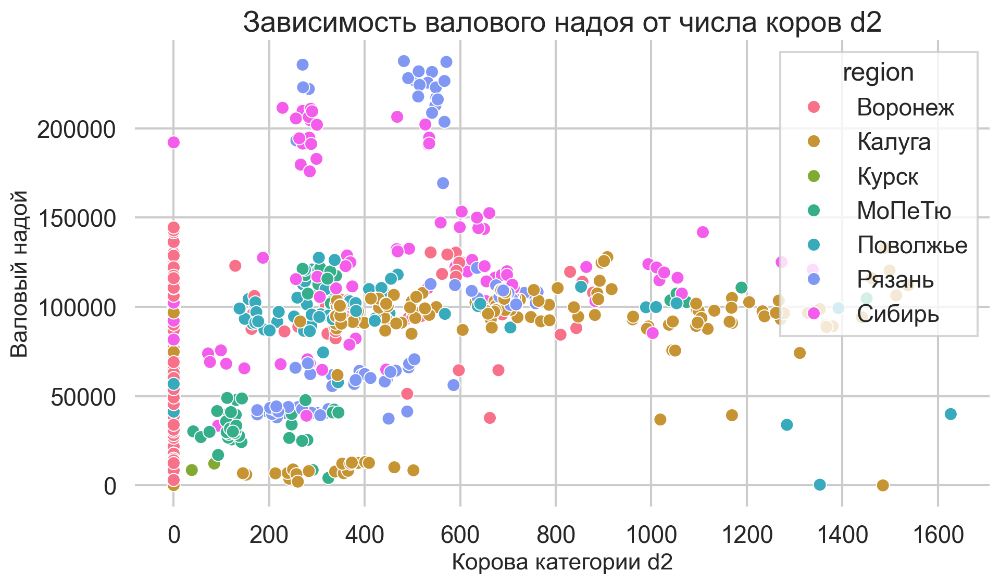

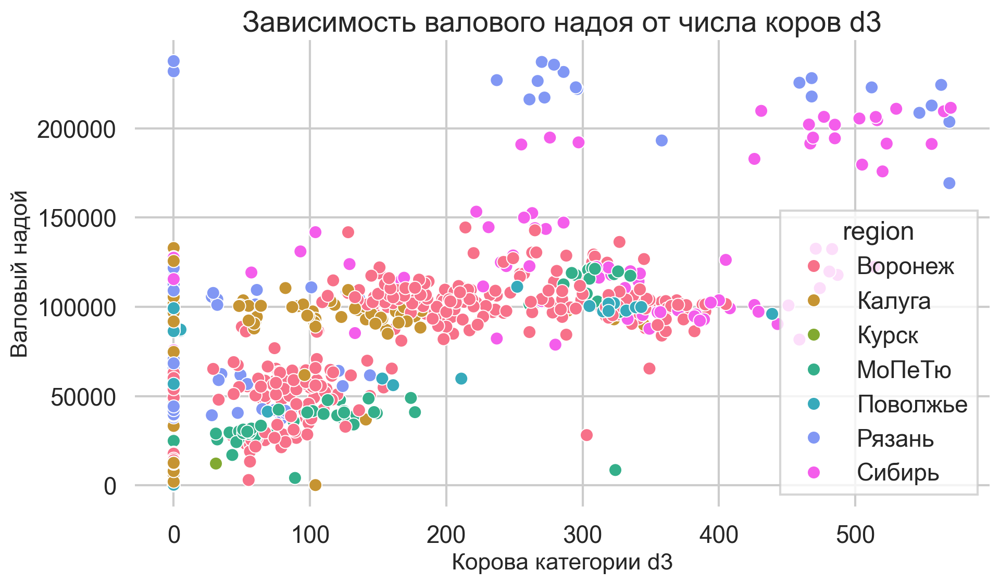

In [14]:
for i in ['d0', 'd1', 'd2', 'd3']:
    fig = plt.figure(figsize=(10,6))
    col_name = f'milk_cows_{i}'
    sns.scatterplot(data=production_indicators, x=col_name, y='gross_milk_yield', hue='region')
    plt.ylabel('Валовый надой', fontsize=16)
    plt.xlabel(f'Корова категории {i}', fontsize=16)
    plt.title(f'Зависимость валового надоя от числа коров {i}', fontsize=20)
    if (i == 'd1'):
        plt.savefig('val_d1.png')
    plt.tight_layout()
    plt.show()

In [15]:
farm_region = round(production_indicators.groupby('region')['farm_name'].count() / production_indicators['farm_name'].nunique(), 3)
farm_region

region
Воронеж    12.271000
Калуга      6.153000
Курск       0.254000
МоПеТю      2.169000
Поволжье    2.254000
Рязань      3.254000
Сибирь      3.254000
Name: farm_name, dtype: float64

In [16]:
farm_region = round(herd_metrics.groupby('region')['farm_name'].count() / herd_metrics['farm_name'].nunique(), 3)
farm_region

region
Воронеж    23.362000
Калуга     12.750000
Курск       1.062000
МоПеТю      3.350000
Поволжье    2.912000
Рязань      5.850000
Сибирь      4.475000
Name: farm_name, dtype: float64

In [17]:
herd_metrics.bac_contam.mean()

np.float64(41.121657822036674)

<Axes: xlabel='bac_contam', ylabel='Count'>

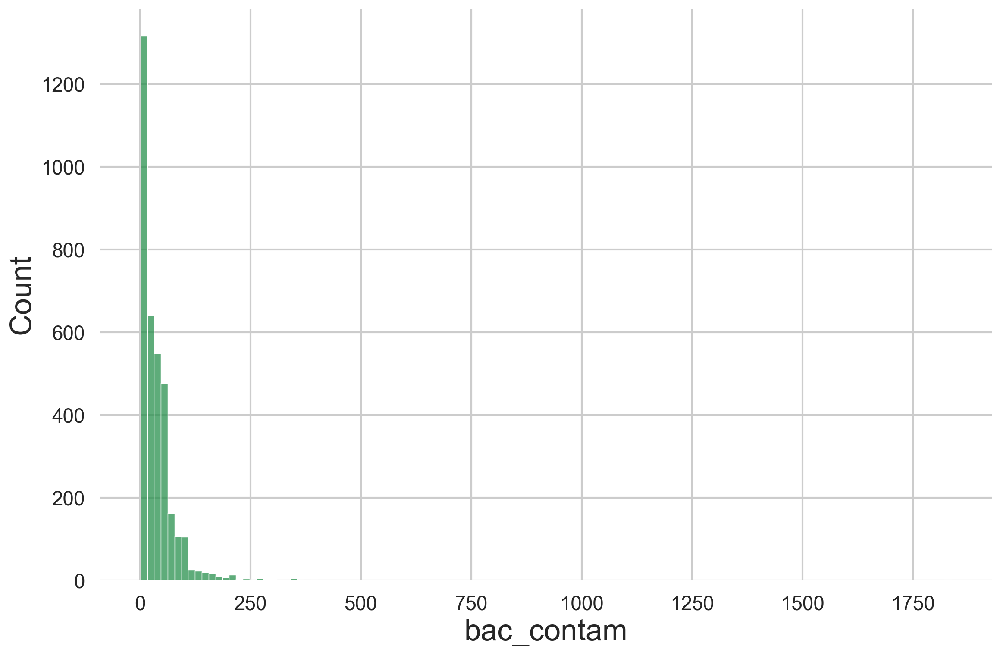

In [18]:
sns.histplot(data=herd_metrics, x='bac_contam')

In [19]:
asd = round(herd_metrics.groupby('region')[['milk_fat', 'milk_protein']].mean().reset_index(), 4)
asd

,region,milk_fat,milk_protein
0,Воронеж,4.094300,3.522200
1,Калуга,3.978500,3.554000
2,Курск,3.884600,3.523100
3,МоПеТю,4.021800,3.378200
4,Поволжье,3.898300,3.402500
5,Рязань,3.809700,3.432800
6,Сибирь,3.767300,3.338800


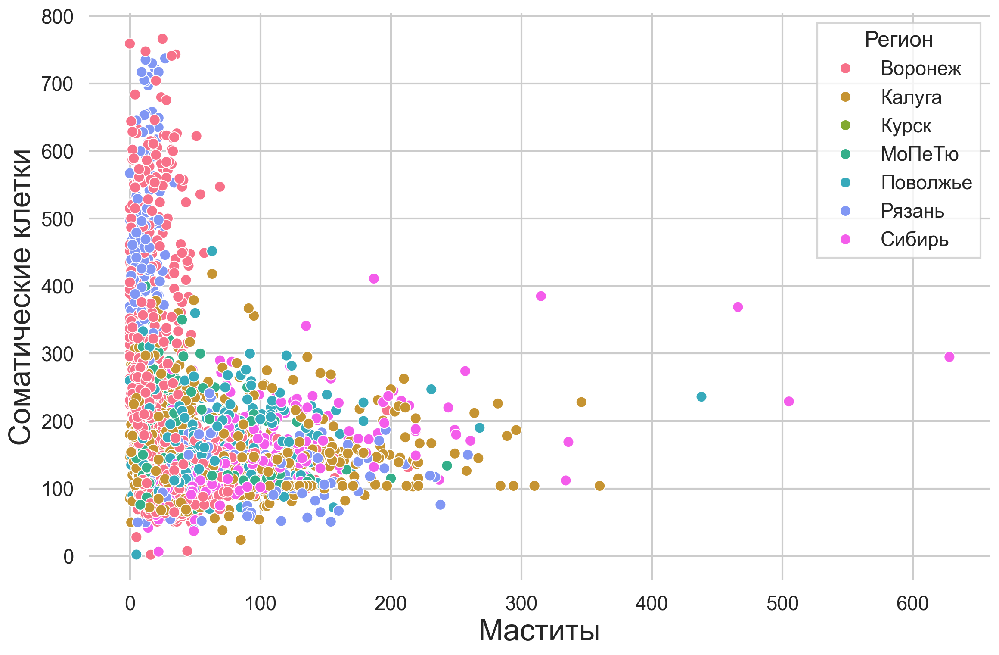

In [20]:
herd_metrics['cow_mastits'] = pd.to_numeric(herd_metrics['cow_mastits'], errors='coerce')
herd_metrics['somatic_cells'] = pd.to_numeric(herd_metrics['somatic_cells'], errors='coerce')
sns.scatterplot(data=herd_metrics, x='cow_mastits', y='somatic_cells', hue='region')
plt.xlabel('Маститы')
plt.ylabel('Соматические клетки')
plt.legend(title='Регион')
plt.savefig('val_d1.png')

<Axes: xlabel='cow_mastits', ylabel='somatic_cells'>

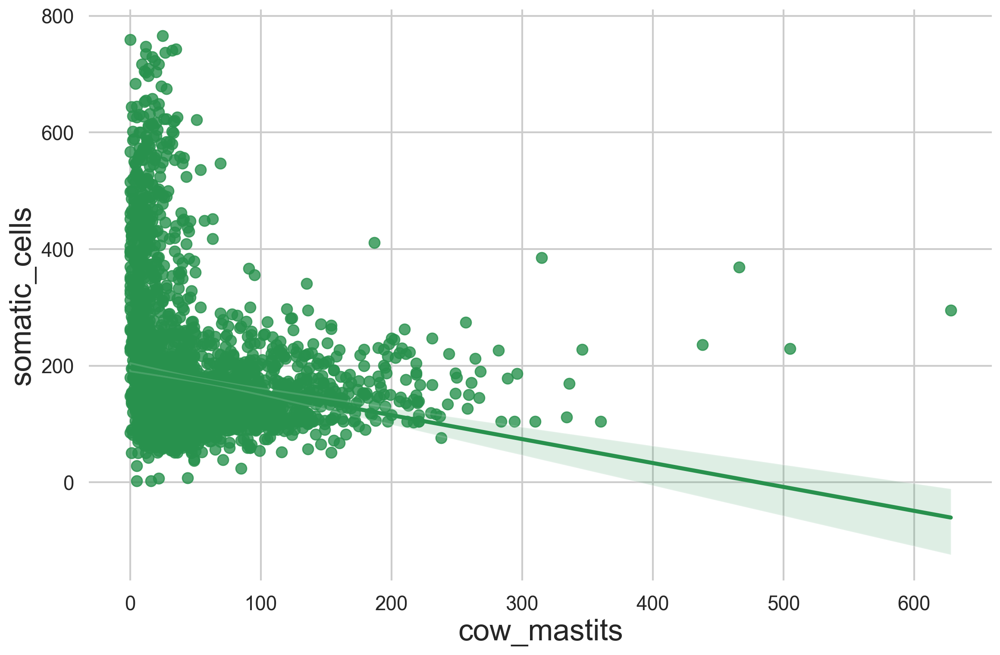

In [21]:
df_clean = herd_metrics.dropna(subset=['cow_mastits', 'somatic_cells'])
sns.regplot(data=df_clean, x='cow_mastits', y='somatic_cells')

In [22]:
herd_metrics = herd_metrics.sort_values('date')
herd_metrics['som_cells_next_month'] = herd_metrics['somatic_cells'].shift(-1)

<Axes: xlabel='som_cells_next_month', ylabel='cow_mastits'>

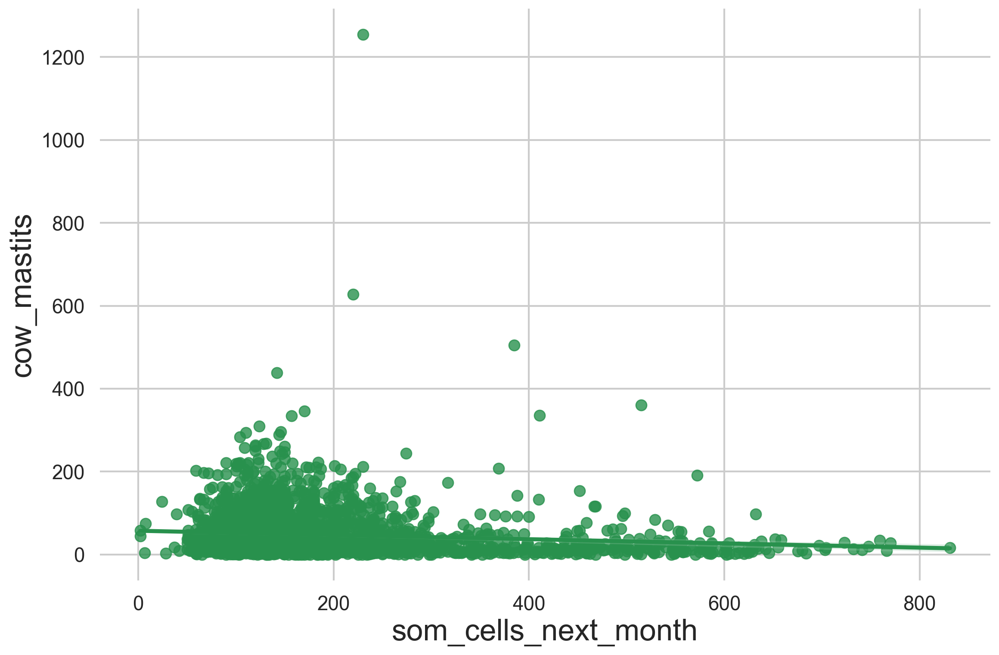

In [23]:
df_clean = herd_metrics.dropna(subset=['cow_mastits', 'som_cells_next_month'])
sns.regplot(data=df_clean, x='som_cells_next_month', y='cow_mastits')

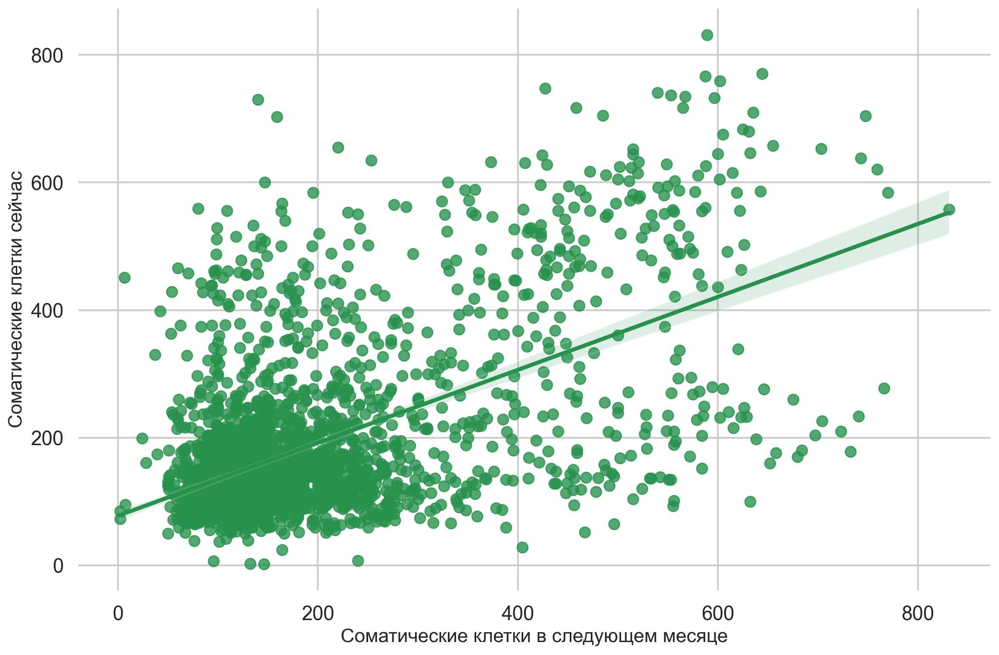

In [24]:
df_clean = herd_metrics.dropna(subset=['somatic_cells', 'som_cells_next_month'])
sns.regplot(data=df_clean, x='som_cells_next_month', y='somatic_cells')
plt.xlabel('Соматические клетки в следующем месяце', fontsize=16)
plt.ylabel('Соматические клетки сейчас', fontsize=16)
plt.savefig('val_d1.png')

In [25]:
mast_type = round(herd_metrics.groupby(['farm_type','region'])['cow_mastits'].mean() / herd_metrics['milk_cow'].mean(), 3)
mast_type

farm_type  region  
ЖК         Воронеж    0.020000
           Калуга     0.036000
           МоПеТю     0.025000
           Поволжье   0.040000
           Рязань     0.035000
           Сибирь     0.050000
МТФ        Воронеж    0.007000
           Калуга     0.013000
           Курск      0.000000
           МоПеТю     0.005000
           Поволжье   0.021000
           Рязань     0.006000
РЖК        Воронеж    0.005000
           Курск      0.011000
РМ         Воронеж         NaN
           Калуга     0.000000
           Курск           NaN
           Рязань          NaN
           Сибирь          NaN
Name: cow_mastits, dtype: float64

In [26]:
herd_metrics[(herd_metrics['farm_type'] == 'РМ') & (herd_metrics['region'] == 'Калуга') & (herd_metrics['milk_cow'] > 0)]

,date,region,prod_farm_name,farm_type,farm_name,ls_capacity,ls_occupancy,forage_cow,milk_cow,dry_cow,milk_marketab_prc,forcow_milk_yeild,forcow_milk_yeild_stand,milk_fat,milk_protein,somatic_cells,bac_contam,cow_retired,cow_lame,cow_mastits,calves,cow_metrit,ph_urine_avr,som_cells_next_month


In [27]:
type_region = herd_metrics.groupby(['farm_type', 'region']).count()
type_region

date  prod_farm_name  farm_name  ls_capacity  \
farm_type region                                                   
ЖК        Воронеж   1061            1061       1061         1061   
          Калуга     687             687        687          687   
          МоПеТю     201             201        201          201   
          Поволжье   219             219        219          219   
          Рязань     268             268        268          268   
          Сибирь     291             291        291          291   
МТФ       Воронеж    533             533        533          484   
          Калуга      68              68         68           68   
          Курск        5               5          5            5   
          МоПеТю      67              67         67           67   
          Поволжье    14              14         14           14   
          Рязань     134             134        134          110   
РЖК       Воронеж     67              67         67           67   
          Курск       50              50         50           50   
РМ        Воронеж    208             208        208            0   
          Калуга     265             265        265            1   
          Курск       30              30         30           11   
          Рязань      66              66         66            0   
          Сибирь      67              67         67           11   

                    ls_occupancy  forage_cow  milk_cow  dry_cow  \
farm_type region                                                  
ЖК        Воронеж           1061        1061      1061     1061   
          Калуга             687         687       687      687   
          МоПеТю             196         196       196      196   
          Поволжье           218         218       218      218   
          Рязань             268         268       268      268   
          Сибирь             290         291       291      291   
МТФ       Воронеж            480         480       480      480   
          Калуга              68          68        68       68   
          Курск                2           2         2        2   
          МоПеТю              67          67        67       67   
          Поволжье            14          14        14       14   
          Рязань             110         134       134      134   
РЖК       Воронеж             67          67        67       67   
          Курск               50          49        49       49   
РМ        Воронеж              0           0         0        0   
          Калуга               1           1         1        1   
          Курск                0           0         0        0   
          Рязань               0           0         0        0   
          Сибирь               0           0         0        0   

                    milk_marketab_prc  forcow_milk_yeild  \
farm_type region                                           
ЖК        Воронеж                1061                496   
          Калуга                  645                284   
          МоПеТю                  195                 93   
          Поволжье                214                111   
          Рязань                  268                124   
          Сибирь                  291                147   
МТФ       Воронеж                 475                214   
          Калуга                   68                 31   
          Курск                     2                  0   
          МоПеТю                   67                 31   
          Поволжье                 10                 10   
          Рязань                  134                 62   
РЖК       Воронеж                  67                 31   
          Курск                    49                 13   
РМ        Воронеж                   0                  0   
          Калуга                    0                  1   
          Курск                     0                  0   
          Рязань                    0      

In [28]:
farm_mast = herd_metrics.groupby('farm_type')[['cow_mastits', 'milk_cow']].sum()
otn = farm_mast['cow_mastits'] / farm_mast['milk_cow']
# farm_mast
otn

farm_type
ЖК    0.024278
МТФ   0.036249
РЖК   0.029923
РМ         NaN
dtype: float64

In [29]:
herd_metrics.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4301 entries, 0 to 4300
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   date                     4301 non-null   datetime64[ns]
 1   region                   4301 non-null   object        
 2   prod_farm_name           4301 non-null   object        
 3   farm_type                4301 non-null   object        
 4   farm_name                4301 non-null   object        
 5   ls_capacity              3615 non-null   float64       
 6   ls_occupancy             3579 non-null   float64       
 7   forage_cow               3603 non-null   float64       
 8   milk_cow                 3603 non-null   float64       
 9   dry_cow                  3603 non-null   float64       
 10  milk_marketab_prc        3546 non-null   float64       
 11  forcow_milk_yeild        1648 non-null   float64       
 12  forcow_milk_yeild_stand  1648 non-null 

In [30]:
def dates(dff, name):
    dff = dff.copy()
    dff[name] = pd.to_datetime(dff[name], errors='coerce')
    dff['year'] = dff[name].dt.year
    dff['month'] = dff[name].dt.month
    dff['date_month'] = dff[name].dt.to_period('M').dt.to_timestamp()
    return dff
herd_metrics = dates(herd_metrics, 'date')

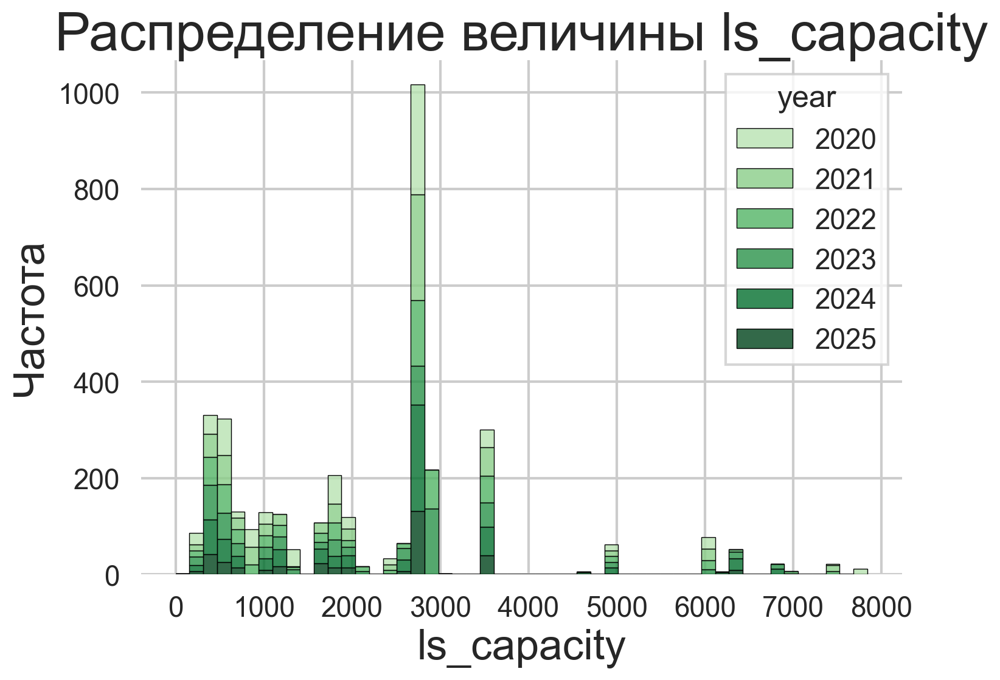

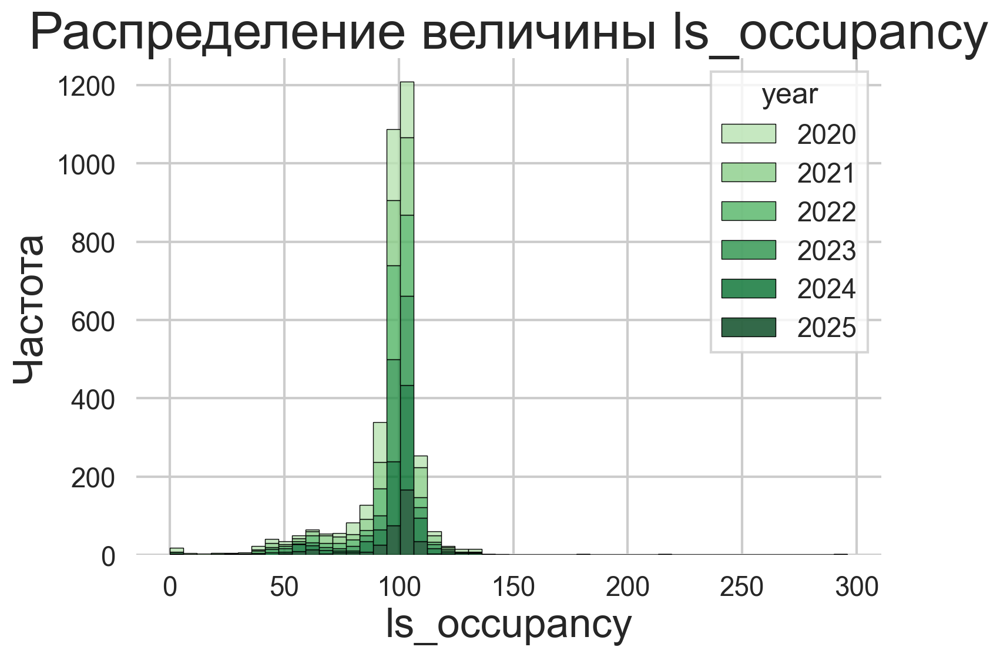

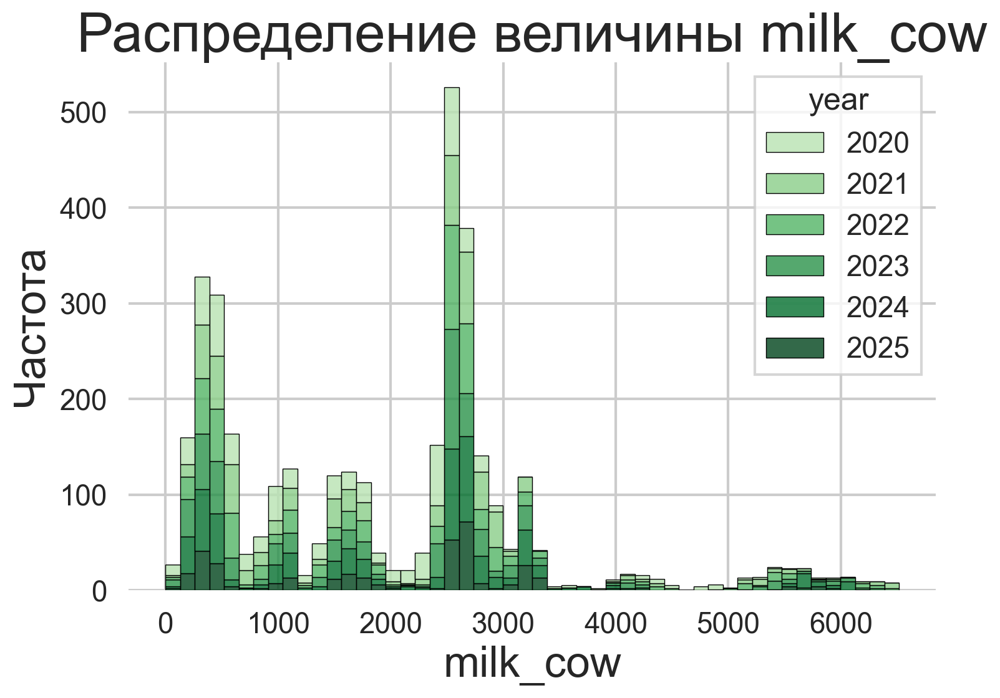

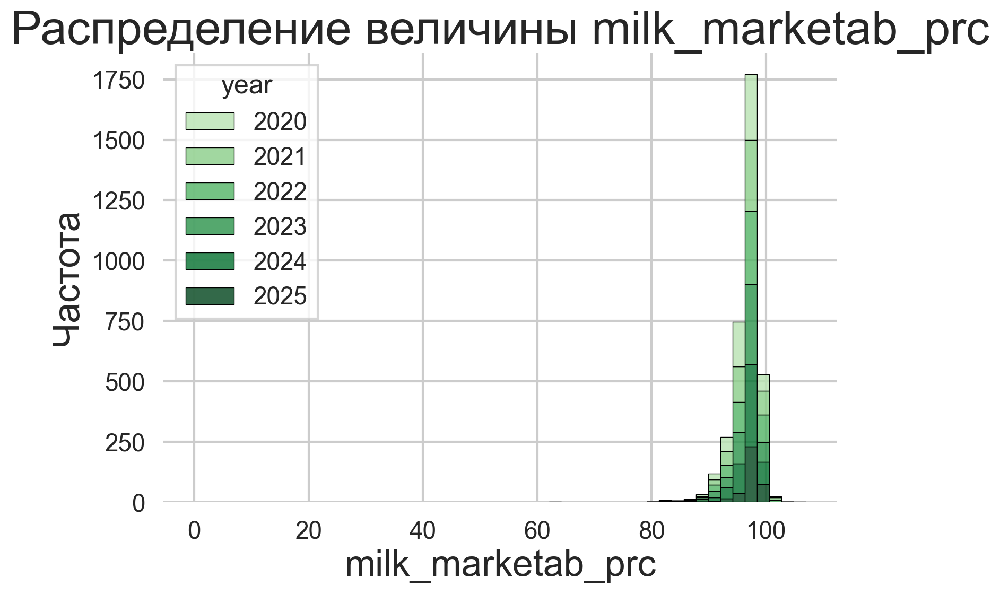

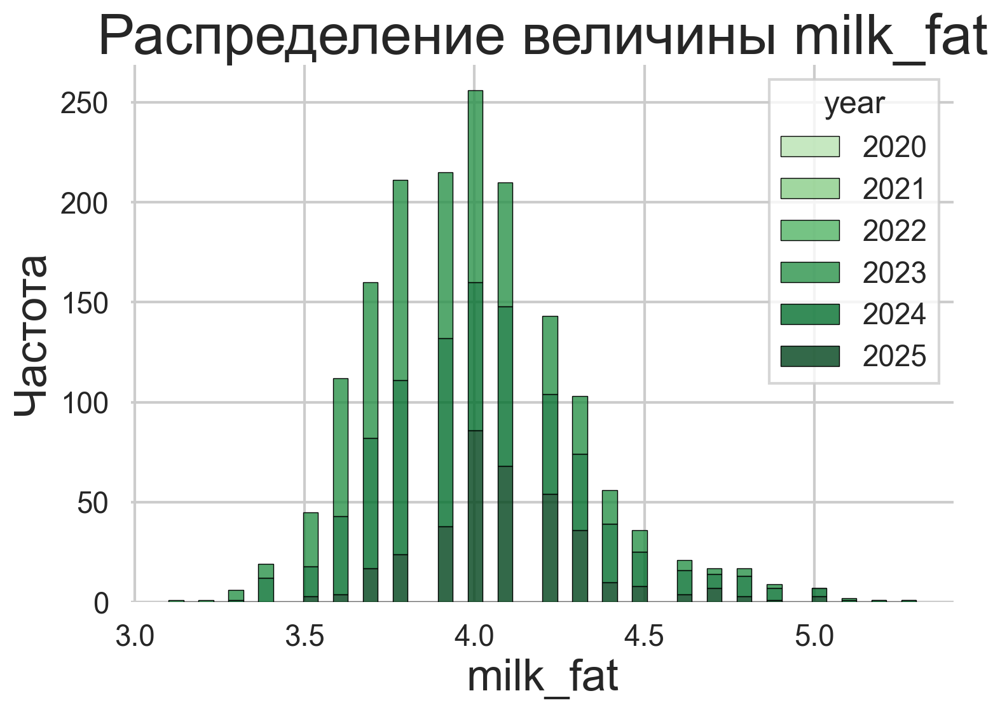

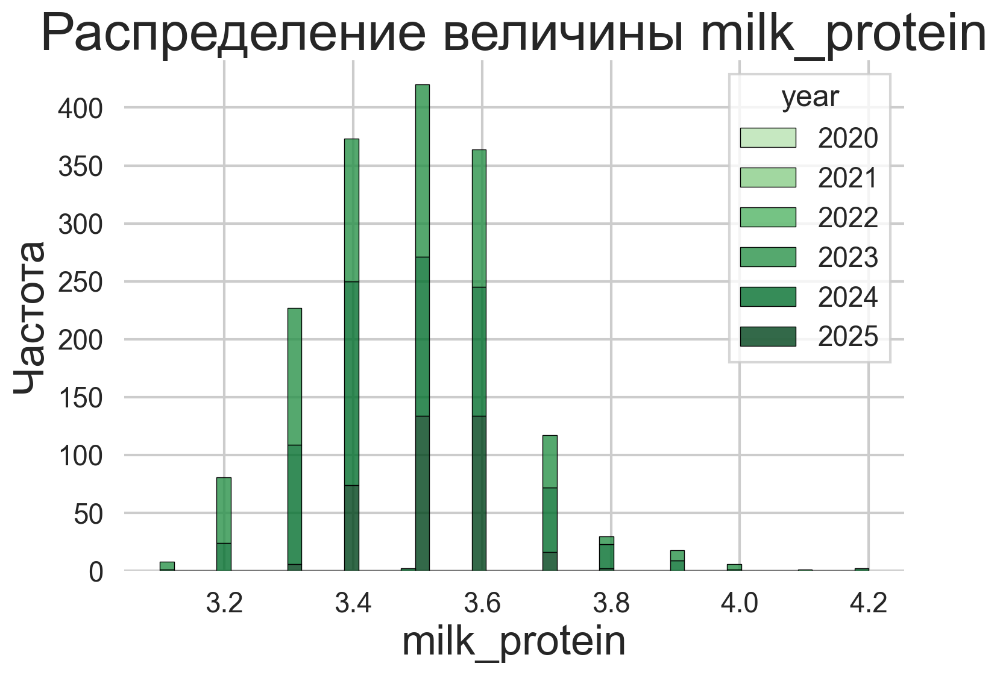

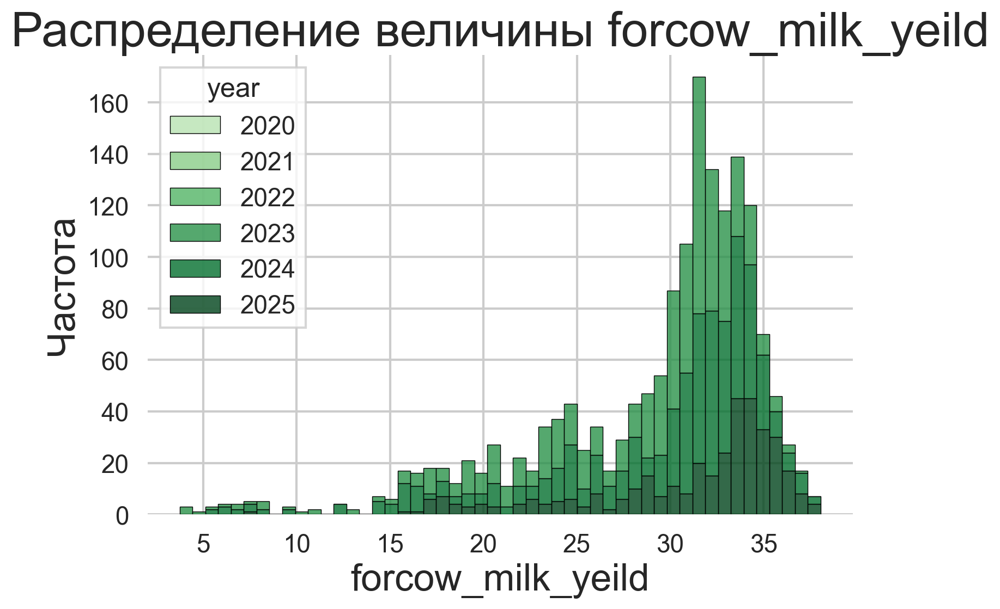

In [31]:
plt.rcParams['figure.figsize'] = (8, 6)
years = sorted(herd_metrics['year'].unique())
cmap = sns.color_palette("Greens", as_cmap=True)
colors = [cmap(0.3 + 0.7 * i / (len(years)-1)) for i in range(len(years))]
for k in ['ls_capacity', 'ls_occupancy', 'milk_cow', 'milk_marketab_prc','milk_fat', 'milk_protein', 'forcow_milk_yeild']:
    sns.histplot(data=herd_metrics,x=k,hue='year',multiple='stack',alpha=0.8, bins=50,palette=colors,edgecolor='black', linewidth=0.5)
    plt.title(f'Распределение величины {k}')
    plt.ylabel('Частота')
    plt.savefig(f"images/{k}.png", dpi=300, bbox_inches='tight')
    plt.show()


In [32]:
herd_metrics.isna().sum()

date                          0
region                        0
prod_farm_name                0
farm_type                     0
farm_name                     0
ls_capacity                 686
ls_occupancy                722
forage_cow                  698
milk_cow                    698
dry_cow                     698
milk_marketab_prc           755
forcow_milk_yeild          2653
forcow_milk_yeild_stand    2653
milk_fat                   2652
milk_protein               2652
somatic_cells               770
bac_contam                  778
cow_retired                 696
cow_lame                    775
cow_mastits                 772
calves                     2823
cow_metrit                 2794
ph_urine_avr               3196
som_cells_next_month        771
year                          0
month                         0
date_month                    0
dtype: int64

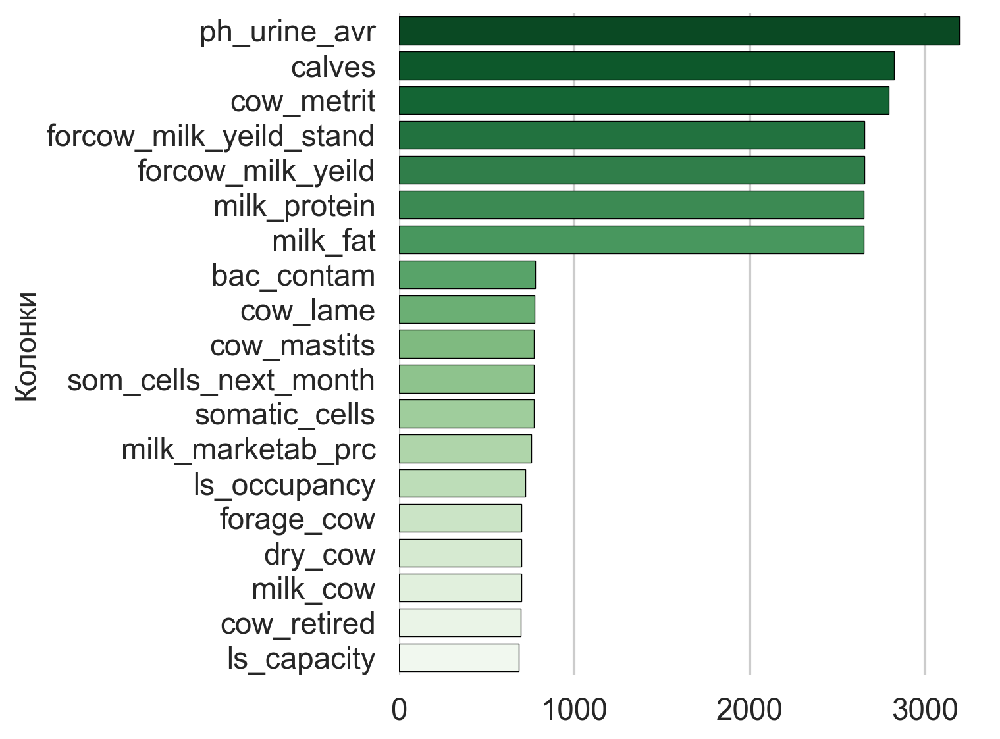

In [33]:
nans = herd_metrics.isna().sum()
nans = nans[nans > 0].sort_values(ascending=False)
sns.barplot(x=nans.values, y=nans.index, palette="Greens_r", edgecolor="black", linewidth=0.5)
plt.ylabel("Колонки", fontsize=16)
plt.savefig("images/nans_herd_metrics.png", dpi=300, bbox_inches="tight")
plt.tight_layout()
plt.show()


In [34]:
production_indicators = dates(production_indicators, 'date')

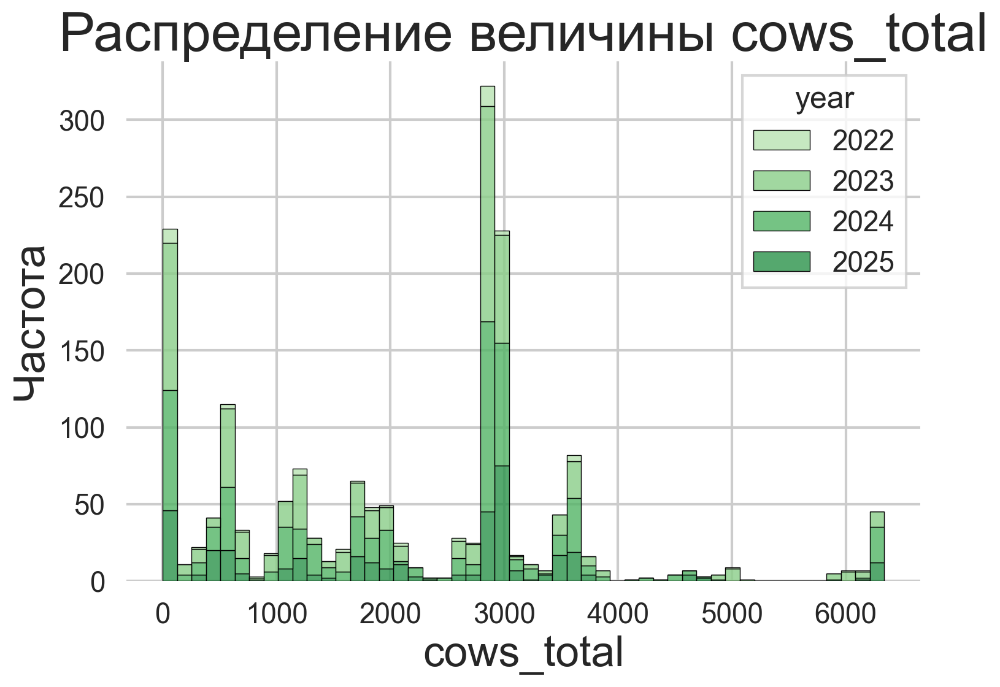

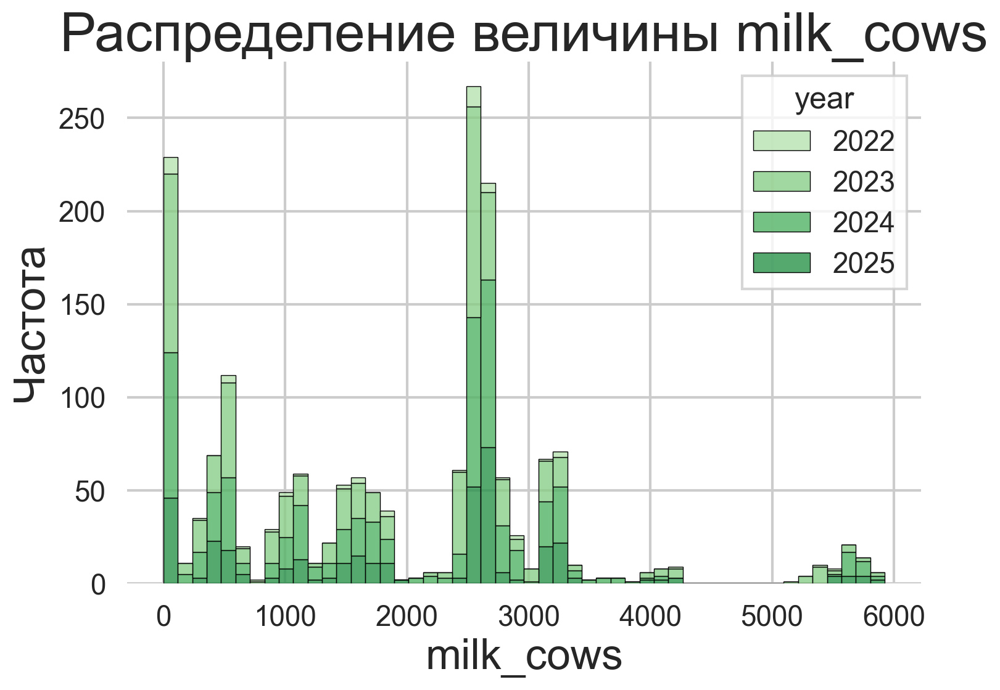

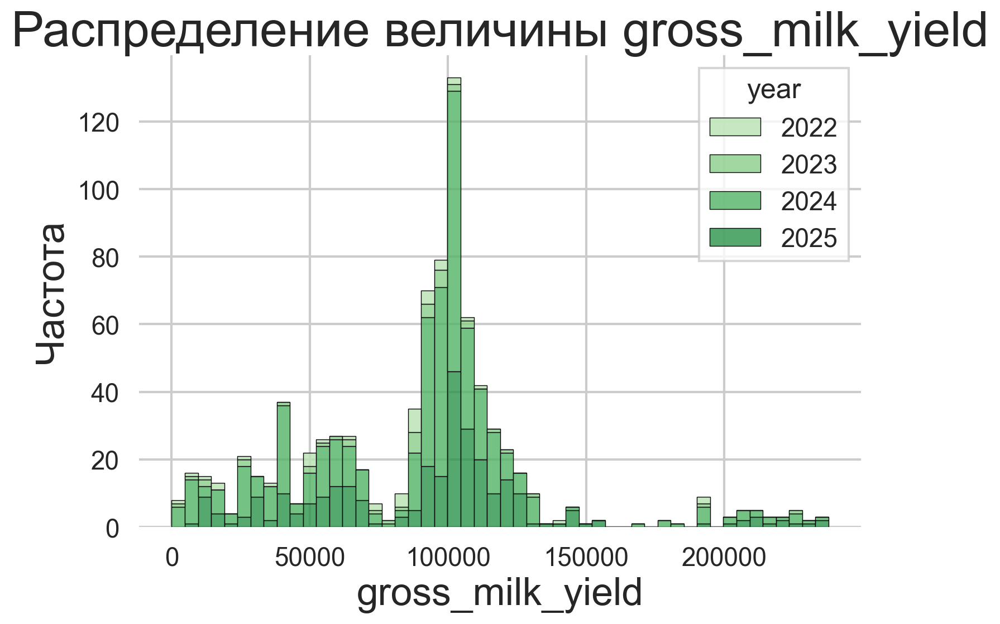

In [35]:
for k in ['cows_total', 'milk_cows', 'gross_milk_yield']:
    sns.histplot(data=production_indicators,x=k,hue='year',multiple='stack',alpha=0.8, bins=50,palette=colors,edgecolor='black', linewidth=0.5)
    plt.title(f'Распределение величины {k}')
    plt.ylabel('Частота')
    plt.savefig(f"images/{k}.png", dpi=300, bbox_inches='tight')
    plt.show()


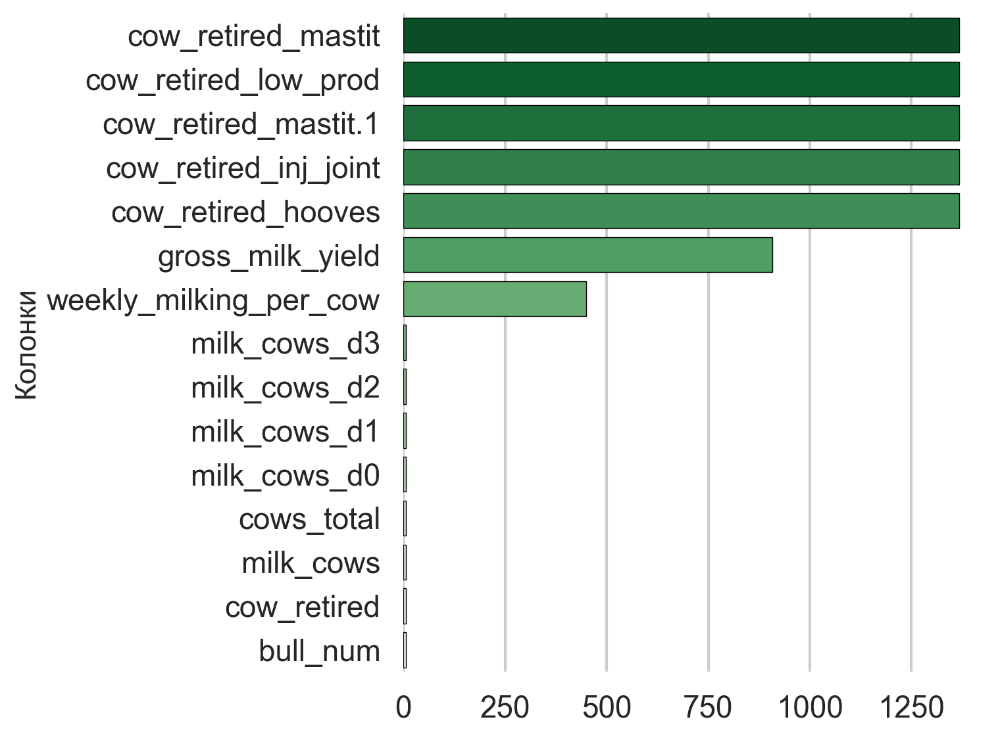

In [36]:
nans = production_indicators.isna().sum()
nans = nans[nans > 0].sort_values(ascending=False)
sns.barplot(x=nans.values, y=nans.index, palette="Greens_r", linewidth=0.5, edgecolor="black")
plt.ylabel('Колонки', fontsize=16)
plt.savefig('images/nans_production_indicators.png', dpi=300, bbox_inches='tight')
plt.show()

In [37]:
nans = production_indicators.isna().sum()
nans

date                         0
region                       0
prod_farm_name               0
farm_type                    0
farm_name                    0
cows_total                   6
milk_cows                    6
milk_cows_d0                 6
milk_cows_d1                 6
milk_cows_d2                 6
milk_cows_d3                 6
weekly_milking_per_cow     449
gross_milk_yield           907
cow_retired                  6
cow_retired_low_prod      1367
cow_retired_hooves        1367
cow_retired_inj_joint     1367
cow_retired_mastit        1367
cow_retired_mastit.1      1367
bull_num                     6
year                         0
month                        0
date_month                   0
dtype: int64

In [38]:
production_indicators[production_indicators['milk_cows'].isna()]

,date,region,prod_farm_name,farm_type,farm_name,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_mastit.1,bull_num,year,month,date_month
756,2024-01-01,Поволжье,Северная Нива Самара,ЖК,ЖК Старое Резяпкино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024,1,2024-01-01
786,2024-02-01,Воронеж,ЭНА Правый берег,МТФ,МТФ Колыбелка,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024,2,2024-02-01
804,2024-02-01,Курск,Защитное,РЖК,РЖК Мелехино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024,2,2024-02-01
811,2024-02-01,Поволжье,Северная Нива Самара,ЖК,ЖК Старое Резяпкино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024,2,2024-02-01
1656,2025-06-01,Воронеж,ЭНА Правый берег,МТФ,РМ Колыбелка,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025,6,2025-06-01
1710,2025-07-01,Воронеж,ЭНА Правый берег,МТФ,РМ Колыбелка,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025,7,2025-07-01


In [39]:
herd_metrics[herd_metrics['milk_marketab_prc'] < 40]

,date,region,prod_farm_name,farm_type,farm_name,ls_capacity,ls_occupancy,forage_cow,milk_cow,dry_cow,milk_marketab_prc,forcow_milk_yeild,forcow_milk_yeild_stand,milk_fat,milk_protein,somatic_cells,bac_contam,cow_retired,cow_lame,cow_mastits,calves,cow_metrit,ph_urine_avr,som_cells_next_month,year,month,date_month
510,2020-08-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Борково,"2,500.000000",55.400000,"1,385.000000",894.000000,491.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,788.000000,127.000000,"1,254.000000",NaN,NaN,NaN,230.000000,2020,8,2020-08-01
544,2020-09-01,Калуга,Калужская Нива Восток,ЖК,ЖК Болдасовка,"1,800.000000",57.333333,"1,032.000000",281.000000,751.000000,30.000000,NaN,NaN,NaN,NaN,217.000000,70.000000,39.000000,100.000000,13.000000,NaN,NaN,NaN,227.000000,2020,9,2020-09-01


<Axes: xlabel='milk_marketab_prc'>

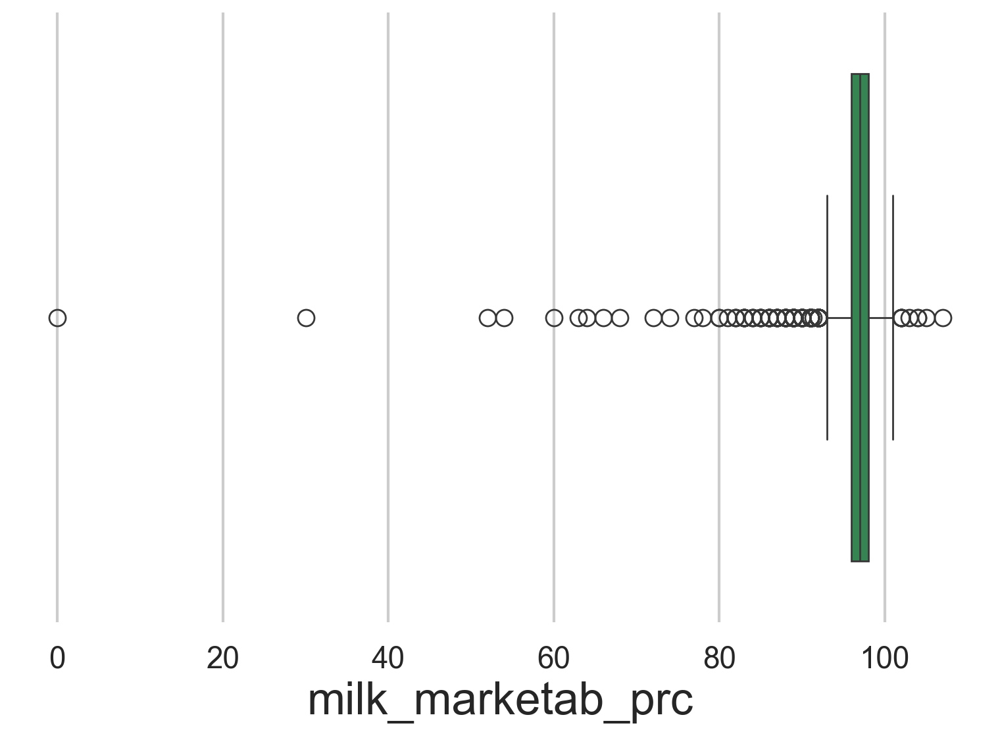

In [40]:
sns.boxplot(data=herd_metrics, x='milk_marketab_prc')

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16411365 entries, 0 to 16411364
Data columns (total 22 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   FeedingTaskID                object 
 1   Date                         object 
 2   FarmName                     object 
 3   FeedNumber                   int64  
 4   SectionID                    int64  
 5   PhysiologicalGroupID         int64  
 6   PhysiologicalGroupName       object 
 7   PhysiologicalGroupHeadCount  int64  
 8   Appetite                     float64
 9   RationName                   object 
 10  RationPart                   float64
 11  TotalWeight_kg               float64
 12  CompletedAt                  object 
 13  year                         object 
 14  IngredientID                 float64
 15  IngredientName               object 
 16  IngredientType               object 
 17  PhysicalWeight_kg            float64
 18  norm_ingr_name               object 
 19

In [42]:
production_indicators.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1747 entries, 0 to 1746
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date                    1747 non-null   datetime64[ns]
 1   region                  1747 non-null   object        
 2   prod_farm_name          1747 non-null   object        
 3   farm_type               1747 non-null   object        
 4   farm_name               1747 non-null   object        
 5   cows_total              1741 non-null   float64       
 6   milk_cows               1741 non-null   float64       
 7   milk_cows_d0            1741 non-null   float64       
 8   milk_cows_d1            1741 non-null   float64       
 9   milk_cows_d2            1741 non-null   float64       
 10  milk_cows_d3            1741 non-null   float64       
 11  weekly_milking_per_cow  1298 non-null   float64       
 12  gross_milk_yield        840 non-null    float64 

In [43]:
df = pd.read_pickle("feeding_and_details.pkl")

In [44]:
df.rename(columns={"Date": "date", "FarmName": "farm_name"}, inplace=True)

In [45]:
df['date'] = pd.to_datetime(df['date'], errors='coerce')

In [46]:
merged = df.merge(production_indicators, on=['date', 'farm_name'], how='right')

<Axes: xlabel='weekly_milking_per_cow', ylabel='PhysicalWeight_kg'>

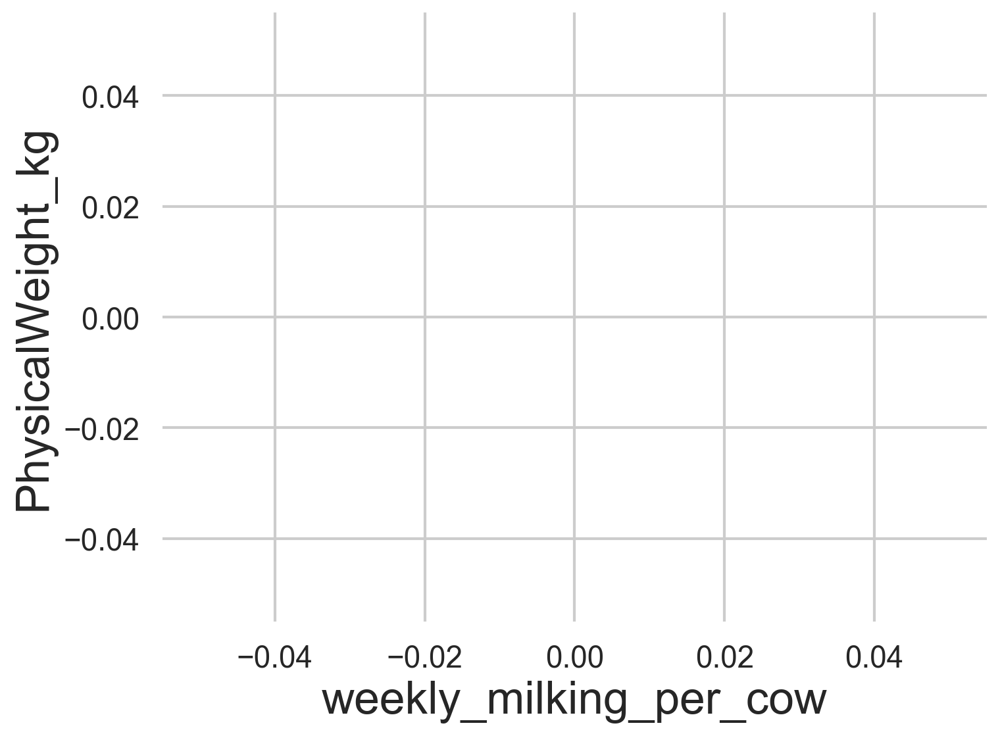

In [47]:
energys = merged[merged['ingredient_group'] == 'energy']
sns.regplot(data=energys, y='PhysicalWeight_kg', x='weekly_milking_per_cow')

In [48]:
gb = df.groupby('ingredient_group')['PhysicalWeight_kg'].mean().reset_index()
gb

,ingredient_group,PhysicalWeight_kg
0,byproducts,315.258272
1,compound_feed_calf_replacements,402.912414
2,energy_source,256.949700
3,fat_oils,28.569145
4,feed_additives_probiotics,16.262090
5,forage_bulk,956.586442
6,medications,12.994273
7,minerals_buffers,9.772613
8,other,938.517570
9,premix_feed,25.647362


<Axes: >

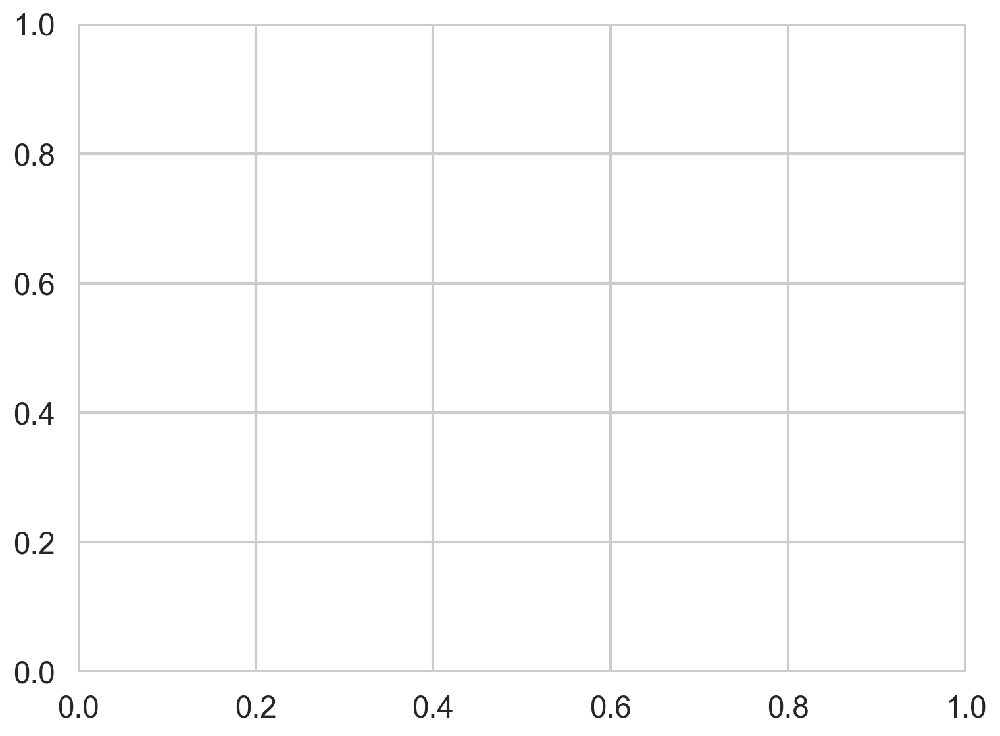

In [49]:
gb = energys.groupby('decoded_name')[['PhysicalWeight_kg', 'weekly_milking_per_cow']].mean()
sns.scatterplot(gb.head(5), x='PhysicalWeight_kg', y='weekly_milking_per_cow', hue='decoded_name')

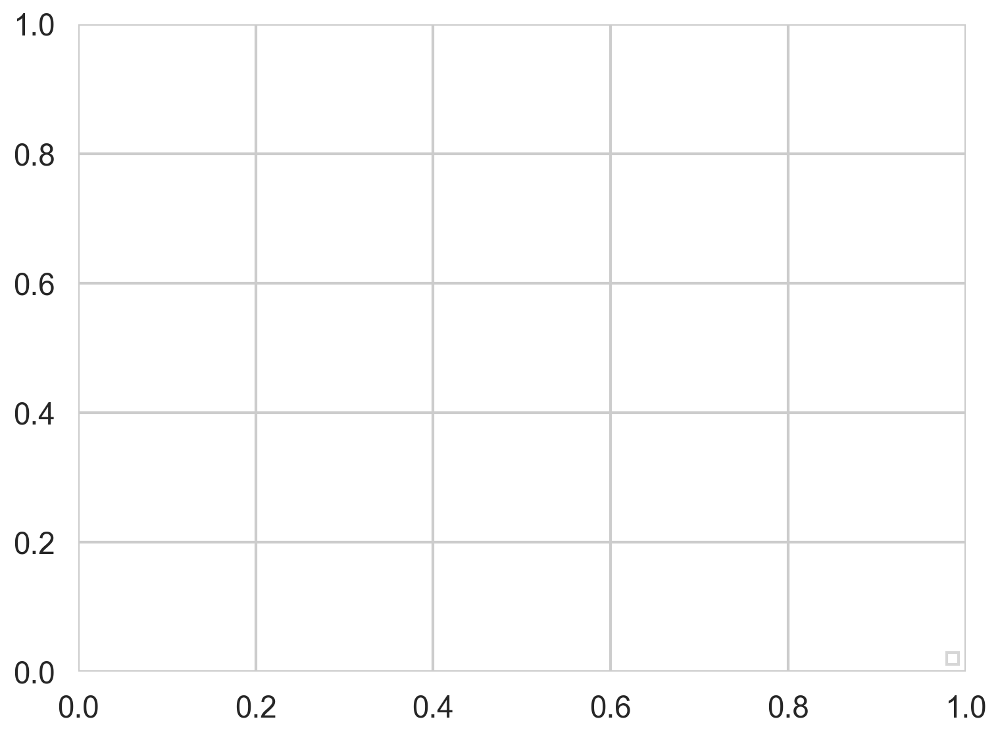

In [50]:
gb = merged[merged['ingredient_group'] == 'forage'].groupby('decoded_name')[['PhysicalWeight_kg', 'weekly_milking_per_cow']].mean()
sns.scatterplot(gb.head(5), x='PhysicalWeight_kg', y='weekly_milking_per_cow', hue='decoded_name')
plt.legend(fontsize=8, ncol=2, loc='lower right')

In [51]:
merged.ingredient_group.unique()

array(['forage_bulk', 'protein_source', 'energy_source',
       'compound_feed_calf_replacements', 'byproducts',
       'wet_ingredients_water', 'feed_additives_probiotics',
       'premix_feed', 'minerals_buffers', 'medications', nan, 'fat_oils',
       'yeast_products', 'other'], dtype=object)

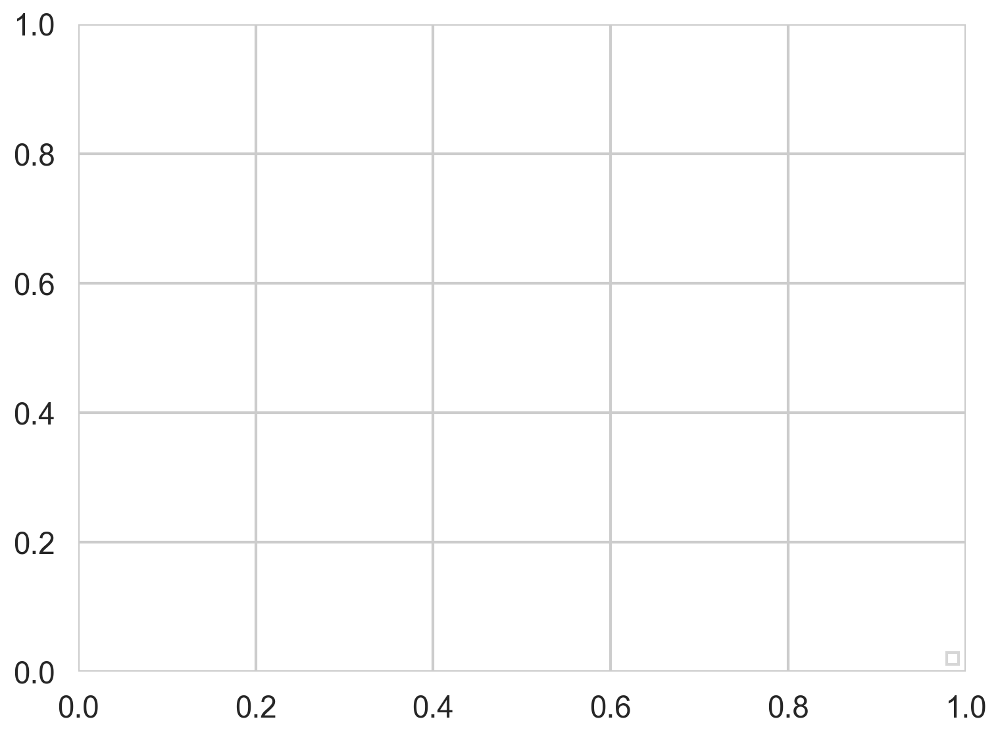

In [52]:
gb = merged[merged['ingredient_group'] == 'protein'].groupby('decoded_name')[['PhysicalWeight_kg', 'weekly_milking_per_cow']].mean()
sns.scatterplot(gb.head(5), x='PhysicalWeight_kg', y='weekly_milking_per_cow', hue='decoded_name')
plt.legend(fontsize=8, ncol=2, loc='lower right')

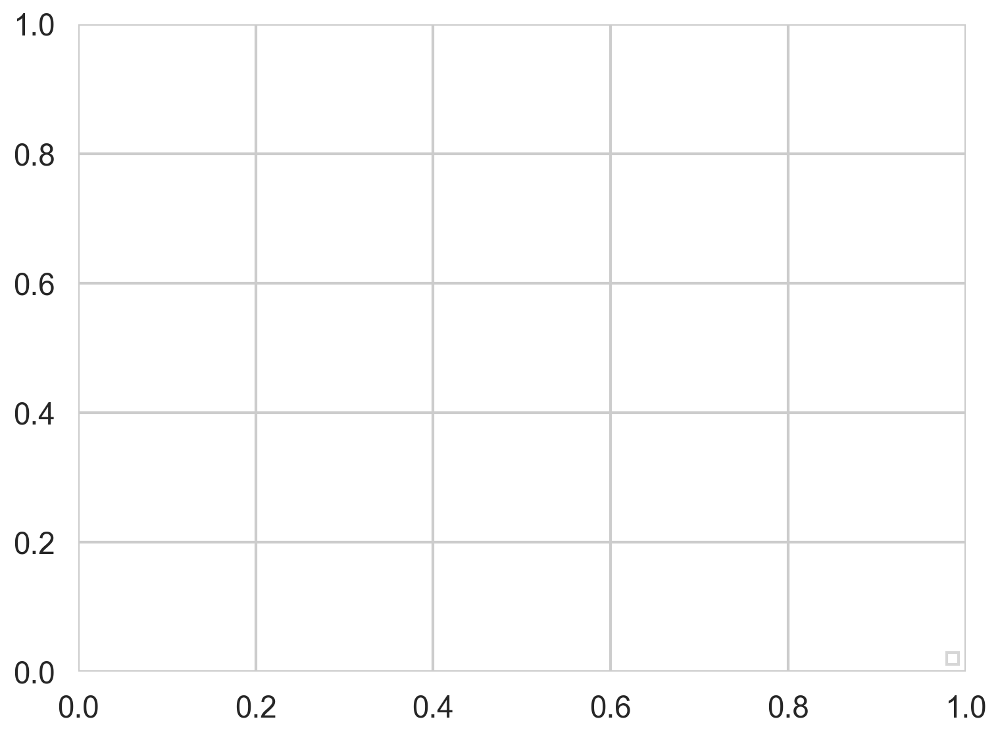

In [53]:
gb = merged[merged['ingredient_group'] == 'mineral_vit'].groupby('decoded_name')[['PhysicalWeight_kg', 'weekly_milking_per_cow']].mean()
sns.scatterplot(gb.head(5), x='PhysicalWeight_kg', y='weekly_milking_per_cow', hue='decoded_name')
plt.legend(fontsize=8, ncol=2, loc='lower right')

In [54]:
feeding_and_details = pd.read_pickle('feeding_and_details.pkl')

In [55]:
gb = feeding_and_details[feeding_and_details['IngredientType'] == 'Medication'].groupby('Appetite')['PhysicalWeight_kg'].mean().reset_index()
gb

,Appetite,PhysicalWeight_kg
0,0.500000,3.413092
1,0.600000,1.973684
2,0.700000,3.449065
3,0.800000,1.287824
4,0.900000,4.338469
5,1.000000,6.386823
6,1.100000,6.276743
7,1.200000,8.916874
8,1.300000,14.296955
9,1.400000,17.733282


<Axes: xlabel='Appetite', ylabel='PhysicalWeight_kg'>

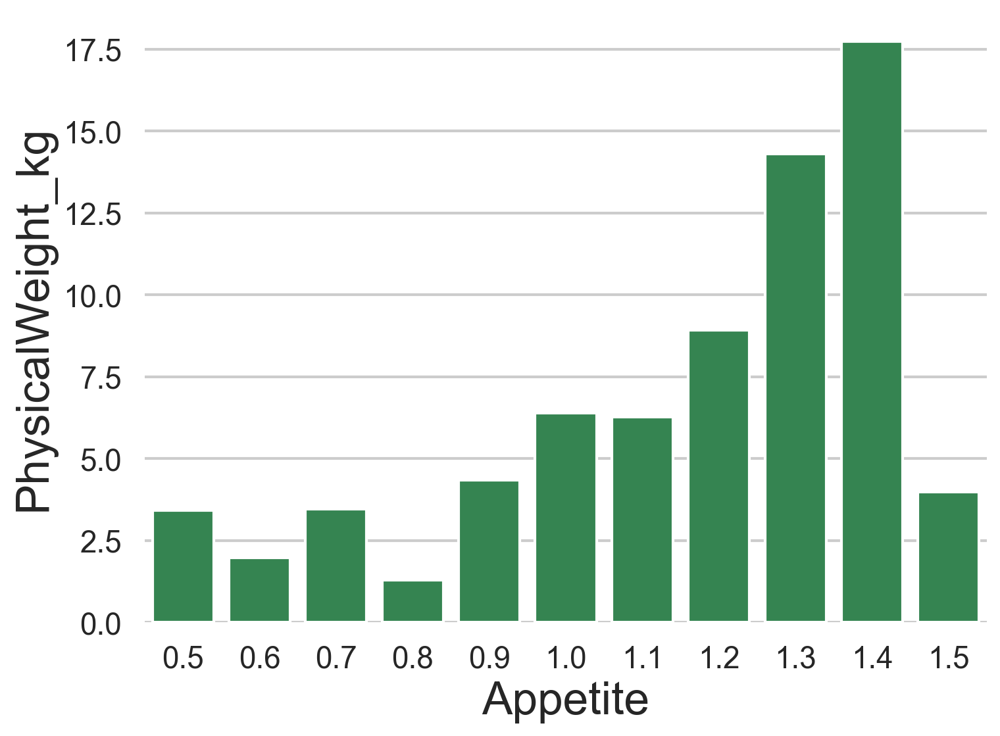

In [56]:
sns.barplot(data=gb, x='Appetite', y='PhysicalWeight_kg')

<Axes: xlabel='Appetite', ylabel='PhysicalWeight_kg'>

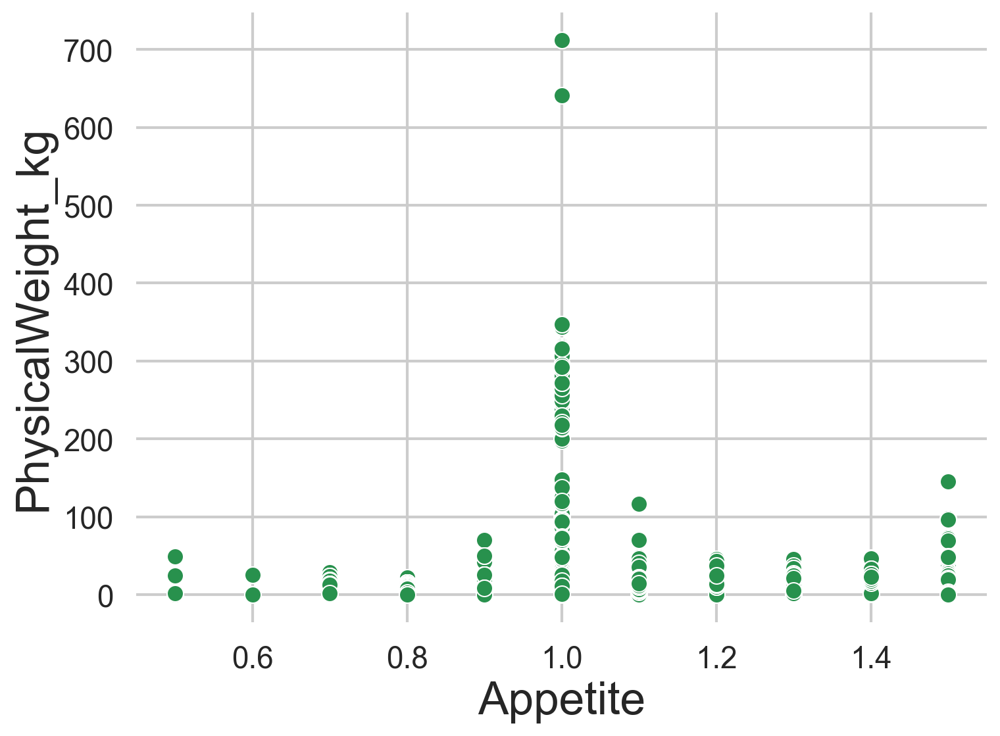

In [57]:
sns.scatterplot(data=feeding_and_details[feeding_and_details['IngredientType'] == 'Medication'], x='Appetite', y='PhysicalWeight_kg')

In [58]:
monthly_feeding.head(5)

,organisation,farm_name,physiological_group_name,feed_name,2022-01-01 00:00:00,2022-02-01 00:00:00,2022-03-01 00:00:00,2022-04-01 00:00:00,2022-05-01 00:00:00,2022-06-01 00:00:00,2022-07-01 00:00:00,2022-08-01 00:00:00,2022-09-01 00:00:00,2022-10-01 00:00:00,2022-11-01 00:00:00,2022-12-01 00:00:00,2023-01-01 00:00:00,2023-02-01 00:00:00,2023-03-01 00:00:00,2023-04-01 00:00:00,2023-05-01 00:00:00,2023-06-01 00:00:00,2023-07-01 00:00:00,2023-08-01 00:00:00,2023-09-01 00:00:00,2023-10-01 00:00:00,2023-11-01 00:00:00,2023-12-01 00:00:00,2024-01-01 00:00:00,2024-02-01 00:00:00,2024-03-01 00:00:00,2024-04-01 00:00:00,2024-05-01 00:00:00,2024-06-01 00:00:00,2024-07-01 00:00:00,2024-08-01 00:00:00,2024-09-01 00:00:00,2024-10-01 00:00:00,2024-11-01 00:00:00,2024-12-01 00:00:00,2025-01-01 00:00:00,2025-02-01 00:00:00,2025-03-01 00:00:00,2025-04-01 00:00:00,2025-05-01 00:00:00,2025-06-01 00:00:00,2025-07-01 00:00:00
0,Детчинское,ЖК Детчинское,Б0 (0-2 мес.),Биотек Микс,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,1.000000,NaN,NaN
1,Детчинское,ЖК Детчинское,Б0 (0-2 мес.),Добавка кормовая Бустер Милк,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.612000,7.435000,9.050000,11.335000,9.665000,16.883000,9.829000,13.223000,7.419000,8.565000,8.763000,30.654000,9.054000,10.681000,13.816000,4.220000,1.919000,1.689000,1.093000,1.652000,1.441000,6.530000,11.296000,11.043000,35.469000,64.735000,185.090000,115.196000,11.184000,NaN
2,Детчинское,ЖК Детчинское,Б0 (0-2 мес.),Добавка кормовая Кальвобустер,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.000000,21.000000,26.000000,11.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Детчинское,ЖК Детчинское,Б0 (0-2 мес.),Добавка кормовая Кальволит,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.509000,15.688000,10.021000,12.080000,8.185000,13.873000,8.114000,16.897000,10.646000,7.243000,11.574000,24.326000,6.924000,7.957000,9.814000,1.372000,2.300000,1.559000,3.246000,7.976000,5.521000,3.937000,7.877000,7.691000,25.286000,112.347000,138.896000,116.126000,4.000000,NaN
4,Детчинское,ЖК Детчинское,Б0 (0-2 мес.),"ЗЦМ ""НЭОМИЛК""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.982000,151.671000,5.816000,26.685000,18.953000,23.898000,0.507000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


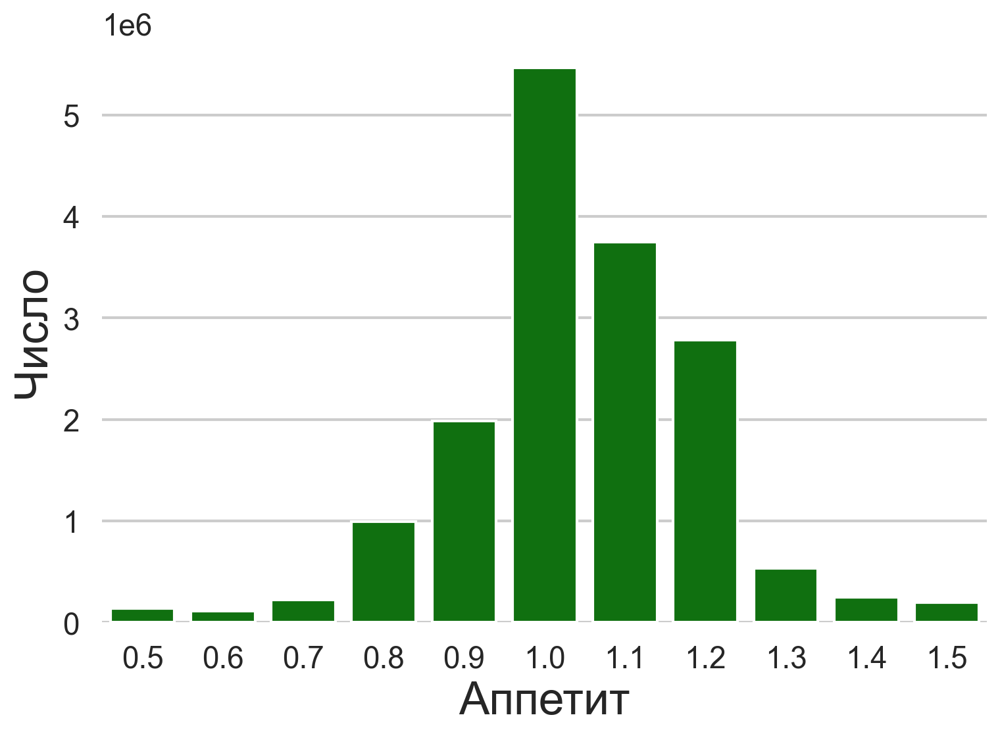

In [59]:
plt.ylabel('Число')
plt.xlabel('Аппетит')
sns.countplot(data=feeding_and_details, x='Appetite', color='green')
plt.savefig('appetite.png')
plt.show()

In [60]:
for_fun = herd_metrics.merge(production_indicators, on=['date', 'farm_name'], how='outer')
for_fun

,date,region_x,prod_farm_name_x,farm_type_x,farm_name,ls_capacity,ls_occupancy,forage_cow,milk_cow,dry_cow,milk_marketab_prc,forcow_milk_yeild,forcow_milk_yeild_stand,milk_fat,milk_protein,somatic_cells,bac_contam,cow_retired_x,cow_lame,cow_mastits,calves,cow_metrit,ph_urine_avr,som_cells_next_month,year_x,month_x,date_month_x,region_y,prod_farm_name_y,farm_type_y,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired_y,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_mastit.1,bull_num,year_y,month_y,date_month_y
0,2020-01-01,Рязань,Ока Молоко Север,ЖК,ЖК Авангард,"1,327.000000",93.669932,"1,243.000000","1,073.000000",170.000000,96.000000,NaN,NaN,NaN,NaN,170.000000,56.000000,34.000000,36.000000,48.000000,NaN,NaN,NaN,120.000000,"2,020.000000",1.000000,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
1,2020-01-01,Калуга,Калужская Нива Восток,ЖК,ЖК Аристово,"2,800.000000",112.500000,"3,150.000000","2,933.000000",217.000000,98.000000,NaN,NaN,NaN,NaN,100.000000,50.000000,52.000000,75.000000,99.000000,NaN,NaN,NaN,122.000000,"2,020.000000",1.000000,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
2,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,"2,800.000000",95.535714,"2,675.000000","2,329.000000",346.000000,94.000000,NaN,NaN,NaN,NaN,92.000000,41.000000,52.000000,90.000000,57.000000,NaN,NaN,NaN,205.000000,"2,020.000000",1.000000,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
3,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров-2,"2,800.000000",101.678571,"2,847.000000","2,378.000000",469.000000,96.000000,NaN,NaN,NaN,NaN,90.000000,29.000000,30.000000,44.000000,27.000000,NaN,NaN,NaN,161.000000,"2,020.000000",1.000000,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
4,2020-01-01,Калуга,Калужская Нива Восток,ЖК,ЖК Богданино,"2,800.000000",105.392857,"2,951.000000","2,396.000000",557.000000,100.000000,NaN,NaN,NaN,NaN,104.000000,50.000000,41.000000,146.000000,42.000000,NaN,NaN,NaN,338.000000,"2,020.000000",1.000000,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4542,2025-07-01,Сибирь,Сибирская Нива Маслянино,РМ,РМ Пеньково,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,160.800000,"2,025.000000",7.000000,2025-07-01,Сибирь,Сибирская Нива Маслянино,РМ,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,164.000000,"2,025.000000",7.000000,2025-07-01
4543,2025-07-01,Калуга,Калужская Нива Юг,РМ,РМ Поляна,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,143.100000,"2,025.000000",7.000000,2025-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
4544,2025-07-01,Калуга,Калужская Нива Запад,РМ,РМ Романово Нов.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"2,025.000000",7.000000,2025-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
4545,2025-07-01,Калуга,Калужская Нива Юг,РМ,РМ Торопово,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76.000000,"2,025.000000",7.000000,2025-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT


<Axes: xlabel='ls_occupancy', ylabel='cow_retired_x'>

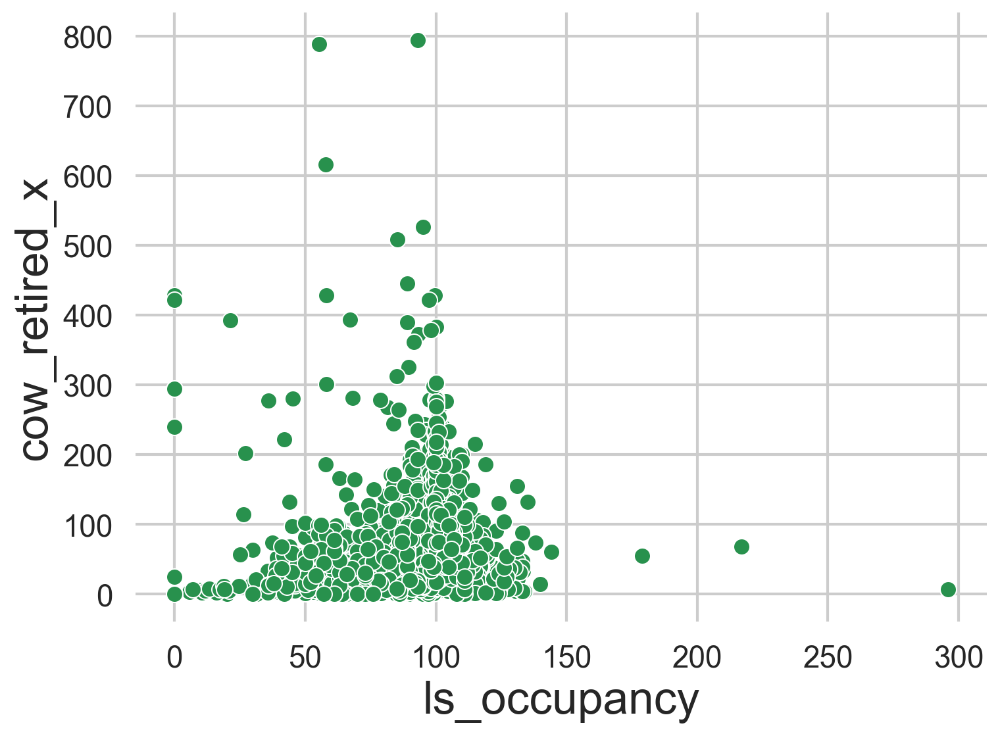

In [61]:
sns.scatterplot(for_fun, x='ls_occupancy', y='cow_retired_x')

In [62]:
gb = herd_metrics.groupby(['farm_name', 'date_month']).agg({
    'cow_retired': 'sum',
    'milk_cow': 'sum',
    'ls_occupancy': 'mean'
})
gb = gb[gb['milk_cow'] > 0]
gb['ret_part'] = gb['cow_retired'] / gb['milk_cow']
overfilled = gb[gb['ls_occupancy'] >= 100]['ret_part'].dropna()
normfilled = gb[gb['ls_occupancy'] < 100]['ret_part'].dropna()

In [63]:
import scipy.stats as scs
t_stat, p_val = scs.ttest_ind(overfilled, normfilled, equal_var=False)
t_stat, p_val

(np.float64(-9.503374984666875), np.float64(6.173703114106513e-21))

In [64]:
overfilled.mean(), normfilled.mean()

(np.float64(0.030932760232003545), np.float64(0.06406258133669514))

In [65]:
corr, pval = stats.pearsonr(gb['ls_occupancy'].dropna(), gb['ret_part'].loc[gb['ls_occupancy'].notna()])
corr, pval

(np.float64(-0.3147914305691907), np.float64(9.053951693413971e-83))

In [66]:
gb = feeding_and_details.groupby('decoded_name')['is_code'].nunique().reset_index()
gb

,decoded_name,is_code
0,,1
1,01.01,1
2,02.01,1
3,03.05,1
4,12.01,1
...,...,...
455,ячмень плющенный,1
456,ячмень плющеный,1
457,ячмень сенаж,1
458,ячмень солома,1


In [67]:
feeding_and_details = feeding_and_details[feeding_and_details['IngredientType'] != 'Premixture']

In [68]:
gb = feeding_and_details.groupby(['IngredientType', 'year'])['FeedingTaskID'].nunique().reset_index()

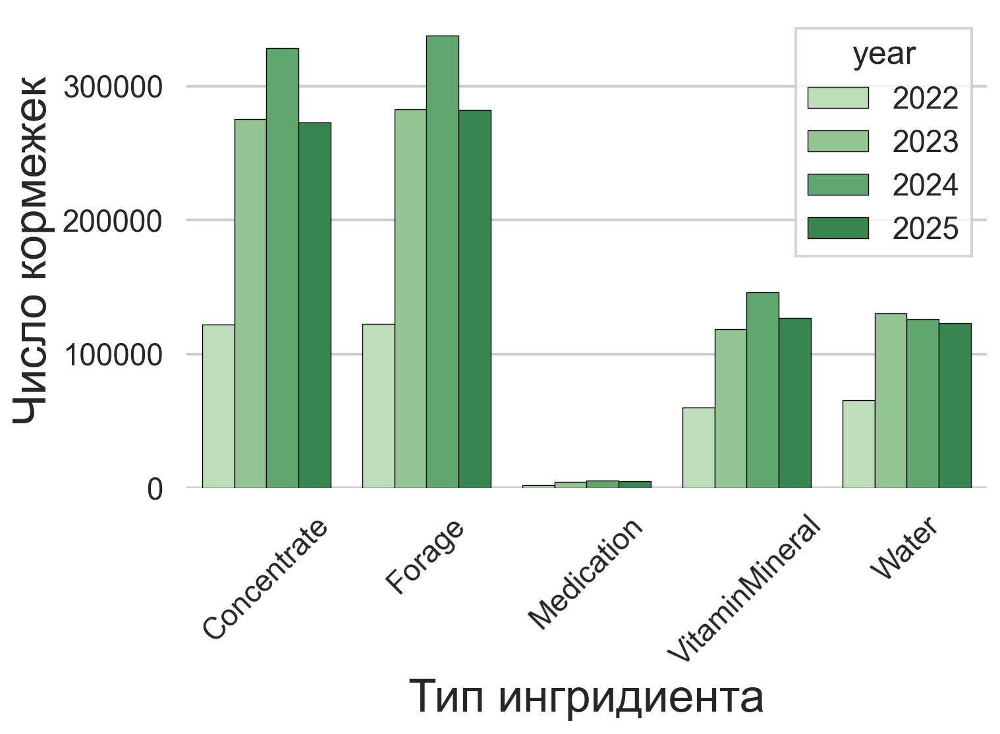

In [69]:
sns.barplot(data=gb, x='IngredientType', y='FeedingTaskID', hue='year', dodge=True, palette=colors, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=45)
plt.tight_layout()
plt.ylabel('Число кормежек')
plt.xlabel('Тип ингридиента')
plt.savefig('images/type_count.png', dpi=300)
plt.show()

In [70]:
gb_norm = gb.groupby('IngredientType').apply(lambda x: x.assign(cnt=x['FeedingTaskID'] / x['FeedingTaskID'].sum())).reset_index(drop=True)

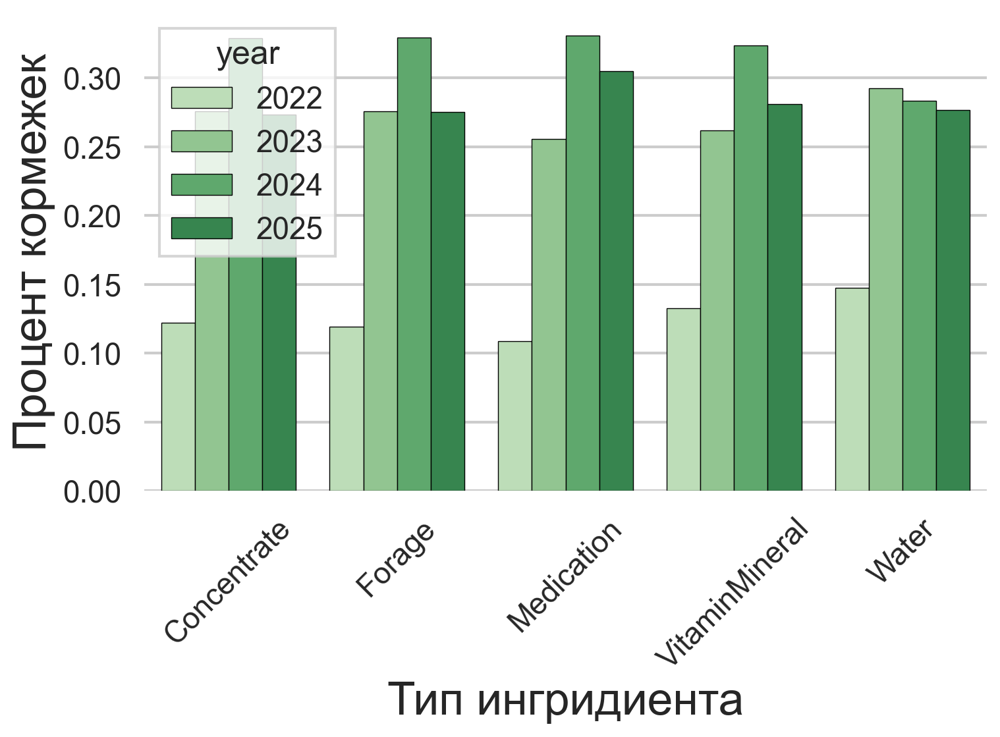

In [71]:
sns.barplot(data=gb_norm, x='IngredientType', y='cnt', hue='year', dodge=True, palette=colors, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=45)
plt.tight_layout()
plt.ylabel('Процент кормежек')
plt.xlabel('Тип ингридиента')
plt.savefig('images/type_count.png', dpi=300)
plt.show()

In [72]:
year_all = gb.groupby('year')['FeedingTaskID'].sum().rename('all_year')
gb_norm = gb.merge(year_all, on='year')
gb_norm['dol'] = gb_norm['FeedingTaskID'] / gb_norm['all_year']

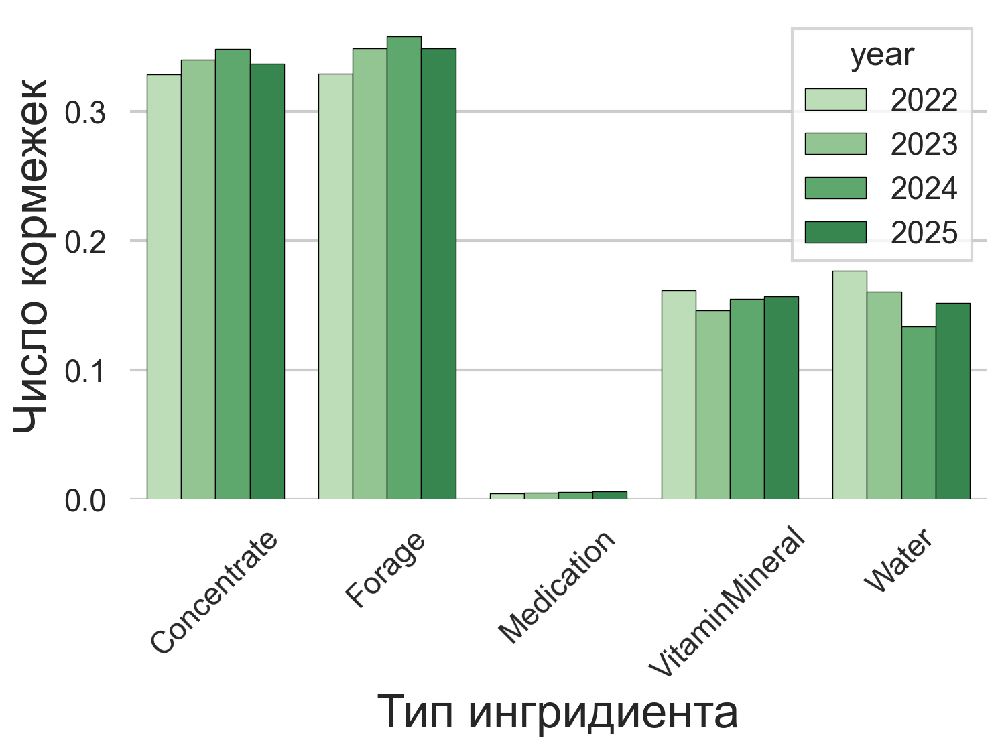

In [73]:
sns.barplot(data=gb_norm, x='IngredientType', y='dol', hue='year', dodge=True, palette=colors, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=45)
plt.tight_layout()
plt.ylabel('Число кормежек')
plt.xlabel('Тип ингридиента')
plt.savefig('images/type_count.png', dpi=300)
plt.show()

In [74]:
feeding_and_details = feeding_and_details[~feeding_and_details['decoded_name'].isin(['02.01', '03.05', '', '12.01', '01.01'])]
gb = feeding_and_details.groupby(['ingredient_group', 'year'])['FeedingTaskID'].nunique().reset_index()

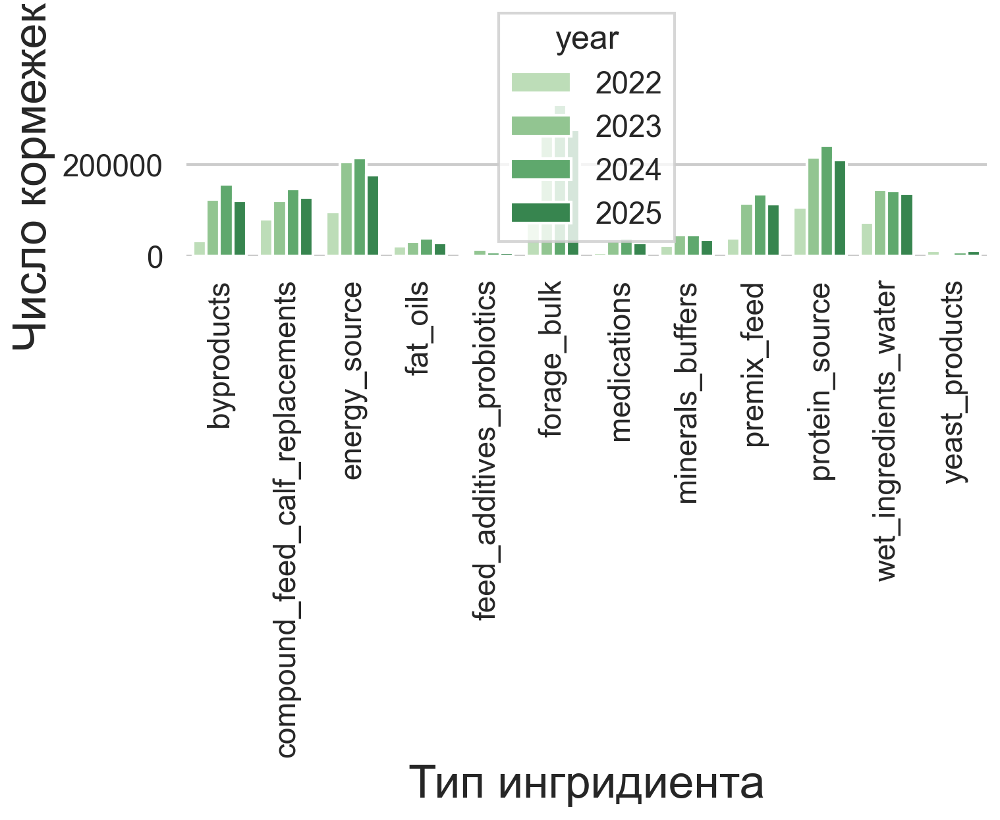

In [75]:
sns.barplot(data=gb, x='ingredient_group', y='FeedingTaskID', hue='year', dodge=True, palette=colors)
plt.xticks(rotation=90)
plt.tight_layout()
plt.ylabel('Число кормежек')
plt.xlabel('Тип ингридиента')
plt.savefig('images/type_count.png', dpi=300)
plt.show()

In [76]:
gb = feeding_and_details.groupby(['ingredient_group', 'year'])['FeedingTaskID'].nunique().reset_index()

In [77]:
year_all = gb.groupby('year')['FeedingTaskID'].sum().rename('all_year')
gb_norm = gb.merge(year_all, on='year')
gb_norm['dol'] = gb_norm['FeedingTaskID'] / gb_norm['all_year']

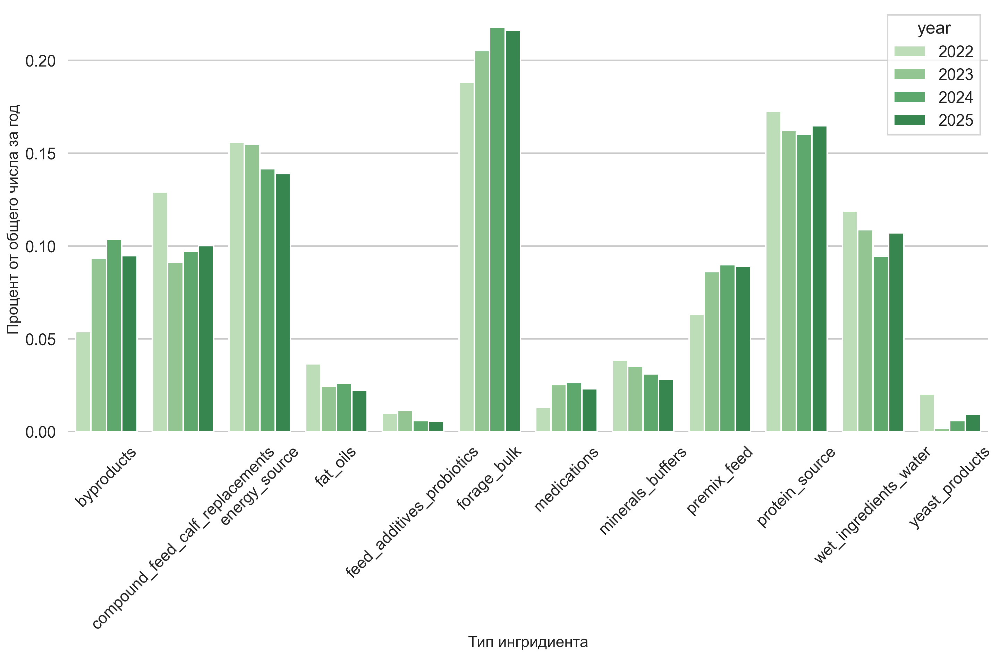

In [78]:
fig = plt.figure(figsize=(15,10))
sns.barplot(data=gb_norm, x='ingredient_group', y='dol', hue='year', dodge=True, palette=colors)
plt.xticks(rotation=45)
plt.tight_layout()
plt.ylabel('Процент от общего числа за год', fontsize=16)
plt.xlabel('Тип ингридиента', fontsize=16)
plt.savefig('images/type_count.png', dpi=300)
plt.show()

In [79]:
feeding_and_details.ingredient_group.unique()

array(['forage_bulk', 'compound_feed_calf_replacements', 'energy_source',
       'protein_source', 'fat_oils', 'wet_ingredients_water',
       'yeast_products', 'premix_feed', 'medications', 'minerals_buffers',
       'feed_additives_probiotics', 'byproducts'], dtype=object)

In [80]:
import pandas as pd
out = pd.read_csv("datasets/out.csv")

In [85]:
feeding_and_details = pd.read_pickle('feeding_and_details.pkl')

In [86]:
feeding_and_details.rename(columns={'Date': 'date', 'FarmName': 'farm_name'}, inplace=True)
feeding_and_details.info()
feeding_and_details['date'] = pd.to_datetime(feeding_and_details['date'], errors='coerce')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16411365 entries, 0 to 16411364
Data columns (total 22 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   FeedingTaskID                object 
 1   date                         object 
 2   farm_name                    object 
 3   FeedNumber                   int64  
 4   SectionID                    int64  
 5   PhysiologicalGroupID         int64  
 6   PhysiologicalGroupName       object 
 7   PhysiologicalGroupHeadCount  int64  
 8   Appetite                     float64
 9   RationName                   object 
 10  RationPart                   float64
 11  TotalWeight_kg               float64
 12  CompletedAt                  object 
 13  year                         object 
 14  IngredientID                 float64
 15  IngredientName               object 
 16  IngredientType               object 
 17  PhysicalWeight_kg            float64
 18  norm_ingr_name               object 
 19

In [87]:
merged = feeding_and_details.merge(production_indicators, on=['date', 'farm_name'], how='right')
merged_clear = merged.dropna(subset=['PhysiologicalGroupName', 'weekly_milking_per_cow'])
merged_clear.PhysiologicalGroupName.unique()

array(['Д0 (Новотельные)', 'Д1', 'Д2', 'С2', 'Нетели', 'С1',
       'Т4 (>1 года)', 'Т1 (3-5 мес.)', 'Т2 (6-8 мес.)', 'Т3 (9-12 мес.)',
       'Б0 (0-2 мес.)', 'Т0 (0-2 мес.)', 'Д3 (Предзапуск)',
       'Б3 (9-12 мес.)', 'С1 нетели', 'С2 нетели', 'Д0', 'Н Нетели', 'Т4',
       'Д3', 'МП Коровы', 'МП Нетели', 'МП БП (бык-производитель)',
       'МП Б1 (6-12 мес. откорм)', 'Б1 (3-5 мес.)',
       'МП БР2 (>1 года рем.)', 'Б4 (>1 года)', 'МП БР1 (6-12 мес. рем.)',
       'МП ТР1 (6-12 мес. рем.)', 'МП Т0 (0-6 мес.)', 'МП Б0 (0-6 мес.)',
       'Б2 (6-8 мес.)', 'Т0 (0-2 мес)'], dtype=object)

In [88]:
production_indicators['ret_sum'] = production_indicators['cow_retired_low_prod'] + production_indicators['cow_retired_hooves'] + production_indicators['cow_retired_inj_joint'] + production_indicators['cow_retired_mastit'] + production_indicators['cow_retired_mastit.1']
production_indicators[production_indicators['ret_sum'] > production_indicators['cow_retired']]

,date,region,prod_farm_name,farm_type,farm_name,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_mastit.1,bull_num,year,month,date_month,ret_sum


In [89]:
feeding_and_details.PhysicalWeight_kg.describe()

count   16,410,455.000000
mean           525.387779
std            833.755709
min              0.000000
25%             68.000000
50%            224.159000
75%            621.000000
max        242,964.000000
Name: PhysicalWeight_kg, dtype: float64

In [90]:
feeding_and_details.TotalWeight_kg.describe()

count   16,411,365.000000
mean         4,594.312535
std          3,439.132280
min              1.000000
25%          2,032.000000
50%          3,658.000000
75%          6,479.000000
max         34,047.000000
Name: TotalWeight_kg, dtype: float64

In [91]:
feeding_and_details.PhysiologicalGroupHeadCount.describe()

count   16,411,365.000000
mean           176.137252
std            116.832590
min              0.000000
25%             91.000000
50%            151.000000
75%            252.000000
max          1,000.000000
Name: PhysiologicalGroupHeadCount, dtype: float64

In [92]:
feeding_and_details.FeedNumber.describe()

count   16,411,365.000000
mean            17.244323
std             12.114074
min              1.000000
25%              8.000000
50%             15.000000
75%             25.000000
max             78.000000
Name: FeedNumber, dtype: float64

In [93]:
feeding_and_details.RationPart.describe()

count   16,411,365.000000
mean             0.777213
std              0.229843
min              0.000000
25%              0.600000
50%              0.800000
75%              1.000000
max              1.000000
Name: RationPart, dtype: float64

In [94]:
feeding_and_details['CompletedAt'] = pd.to_datetime(feeding_and_details['CompletedAt'] , errors='coerce')
feeding_and_details['CompletedAt'].describe()

count                         16338611
mean     2024-03-21 21:49:34.639278336
min                2022-01-01 04:01:00
25%                2023-06-17 05:58:00
50%                2024-04-12 06:12:00
75%                2025-01-19 11:58:00
max      2025-10-22 16:08:47.502024800
Name: CompletedAt, dtype: object

In [95]:
feeding_and_details['time_dif'] = feeding_and_details['CompletedAt'] - feeding_and_details['date']
feeding_and_details.time_dif.describe()

count                        16338611
mean        0 days 10:51:39.491236660
std         0 days 14:27:51.533504933
min      -32 days +16:48:41.746167300
25%                   0 days 05:49:00
50%                   0 days 09:07:00
75%         0 days 12:30:48.508696200
max        31 days 11:43:34.522127700
Name: time_dif, dtype: object

In [96]:
feeding_and_details.shape

(16411365, 23)

In [97]:
def rename_shit(dff):
    """Renames bad PhysiologicalGroupNames"""
    mapping = {'Д0 (Новотельные)': 'Д0', 'Н Нетели': 'Нетели', 'Д3 (Предзапуск)': 'Д3', 'D3': 'Д3', 
               'Нетели 1  группа': 'Нетели','Сух-2': "С2", 'Д-3': 'Д3', 'сух 1': 'С1', 'сух 2': 'С2', 'С1 нетели': 'С1', 
               'С2 нетели': 'С2', 'Н НЕТЕЛИ': 'Нетели', 'Сух 2 Нетели': 'С2', 'С2 Нетели': 'С2'}

    dff["PhysiologicalGroupName"] = dff["PhysiologicalGroupName"].replace(mapping)
    return dff

feeding_and_details = rename_shit(feeding_and_details)
feeding_and_details["PhysiologicalGroupName"].unique()

array(['Д1', 'Т3 (9-12 мес.)', 'Нетели', 'Д2', 'Т0 (0-2 мес.)',
       'Т1 (3-5 мес.)', 'Т4 (>1 года)', 'С1', 'С2', 'Д0', 'Т2 (6-8 мес.)',
       'Д3', 'Б0 (0-2 мес.)', 'Т3 9-12', 'Т0', 'Б3 (9-12 мес.)',
       'Т0 (3-5 мес.)', 'Т2', 'МГ Т3', 'Т2 6-8', 'Т4', 'Т3',
       'Б2 (6-8 мес.)', 'Б1 (3-5 мес.)', 'Т4 13-20', 'Телята СВОД Навесы',
       'МГ Т2', 'Т3 (9-12 мес)', 'МП Коровы', 'МП Нетели',
       'МП БП (бык-производитель)', 'Б4 (>1 года)',
       'МП Б1 (6-12 мес. откорм)', 'МП Т2 (>1 года откорм)',
       'МП БР2 (>1 года рем.)', 'МП БР1 (6-12 мес. рем.)',
       'МП ТР1 (6-12 мес. рем.)', 'Телята домики', 'МП Т0 (0-6 мес.)',
       'МП ТР2 (>1 года рем.)', 'МП Б0 (0-6 мес.)',
       'МП Б2 (>1 года откорм)', 'быки племенные', 'Лошади',
       'Т0 (0-2 мес)', 'Коровы'], dtype=object)

In [98]:
cows = ['Д1', 'Д2', 'С1', 'С2', 'Д0', 'Д3']
df = feeding_and_details[feeding_and_details['PhysiologicalGroupName'].isin(cows)].copy()
df.shape

(11431498, 23)

In [99]:
df.PhysiologicalGroupName.unique()

array(['Д1', 'Д2', 'С1', 'С2', 'Д0', 'Д3'], dtype=object)

In [100]:
df[df['PhysicalWeight_kg'] > df['TotalWeight_kg']].shape

(5387, 23)

In [101]:
df[df['time_dif'] < pd.Timedelta(0)].shape

(21996, 23)

In [102]:
df = df[df['PhysicalWeight_kg'] != 0]
df.shape

(11358266, 23)

In [103]:
df = df[df['PhysicalWeight_kg'] < 200_000]

<Axes: xlabel='PhysicalWeight_kg'>

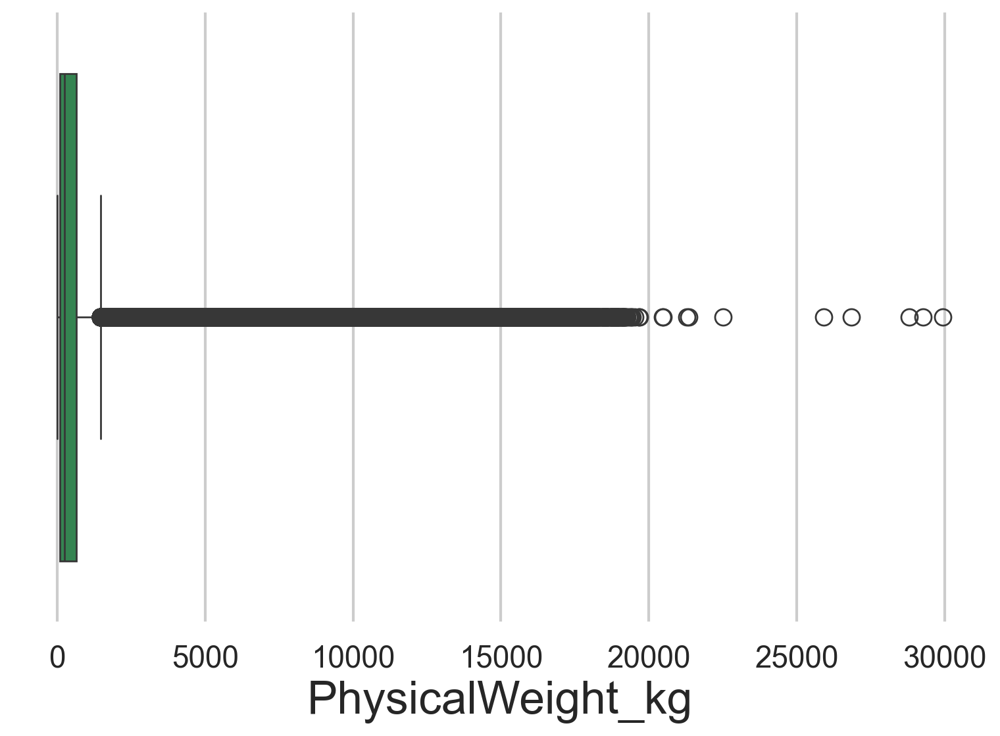

In [104]:
sns.boxplot(data=df, x='PhysicalWeight_kg')

<Axes: xlabel='PhysicalWeight_kg', ylabel='Count'>

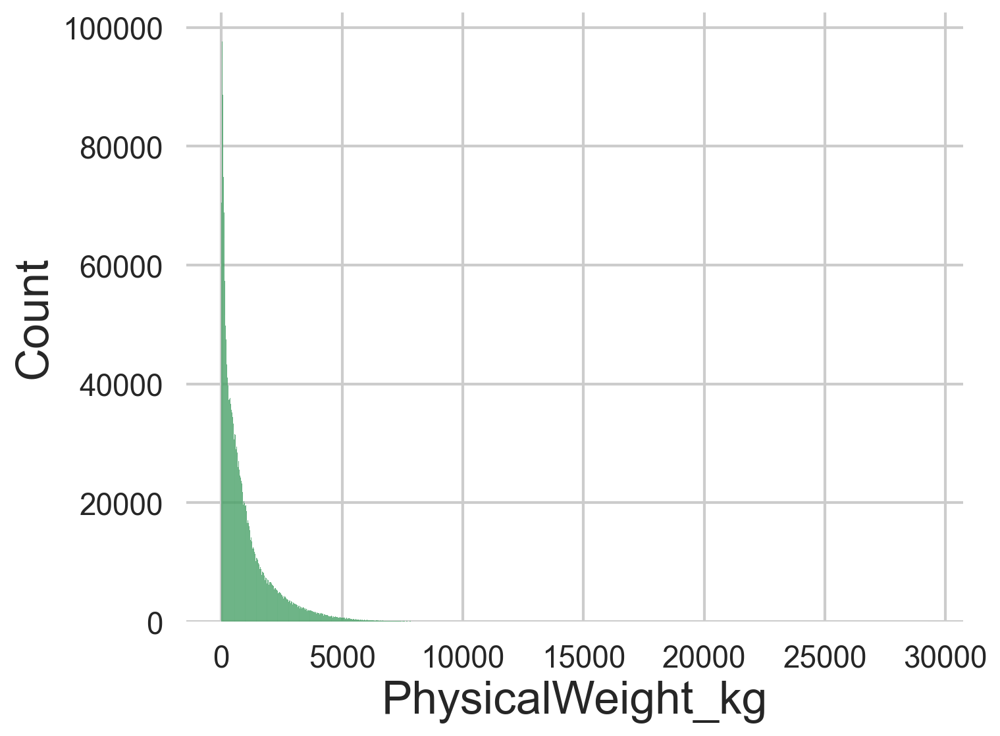

In [105]:
sns.histplot(data=df[df['ingredient_group'] == 'forage_bulk'], x='PhysicalWeight_kg')

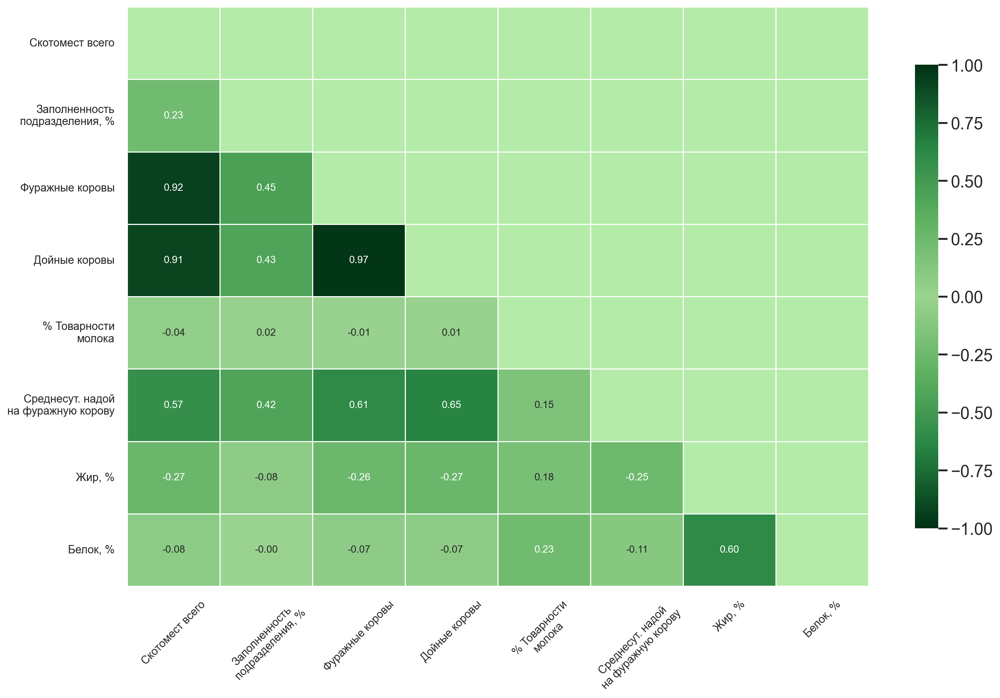

In [114]:
import textwrap
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
plt.figure(figsize=(15,10))
custom_greens_sym = ["#003014", "#258241", "#5fb162", "#9ad390", '#5fb162', '#258241', '#003014']
to_rus = {
    "ls_capacity": 'Скотомест всего',
    'ls_occupancy': 'Заполненность подразделения, %',
    'forage_cow': 'Фуражные коровы',
    'milk_cow': 'Дойные коровы',
    'milk_marketab_prc': '% Товарности молока', 
    'forcow_milk_yeild': 'Среднесут. надой на фуражную корову',
    'milk_fat': 'Жир, %',
    'milk_protein': 'Белок, %'
}
cmap = LinearSegmentedColormap.from_list("custom_green", custom_greens_sym)
cols = list(to_rus.keys())
corr = herd_metrics[cols].corr(method='spearman')
corr = corr.rename(index=to_rus, columns=to_rus)
def wrap_labels(labels, width=18):
    return ['\n'.join(textwrap.wrap(label, width)) for label in labels] #Ммм, вайбкодик
corr.index = wrap_labels(corr.index, width=18)
corr.columns = wrap_labels(corr.columns, width=18)
mask = corr.where(~np.triu(np.ones_like(corr, dtype=bool)))
cmap.set_bad(color="#b4eba9") 
norm = TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
ax = sns.heatmap(mask, annot=True, cmap=cmap, norm=norm, fmt='.2f', annot_kws={"size": 10}, cbar_kws={"shrink": 0.8}, linewidths=1, linecolor='white')
ax.set_facecolor('white')
plt.xticks(rotation=45, fontsize=11)
plt.yticks(rotation=0, fontsize=11)
plt.tight_layout()
plt.show()

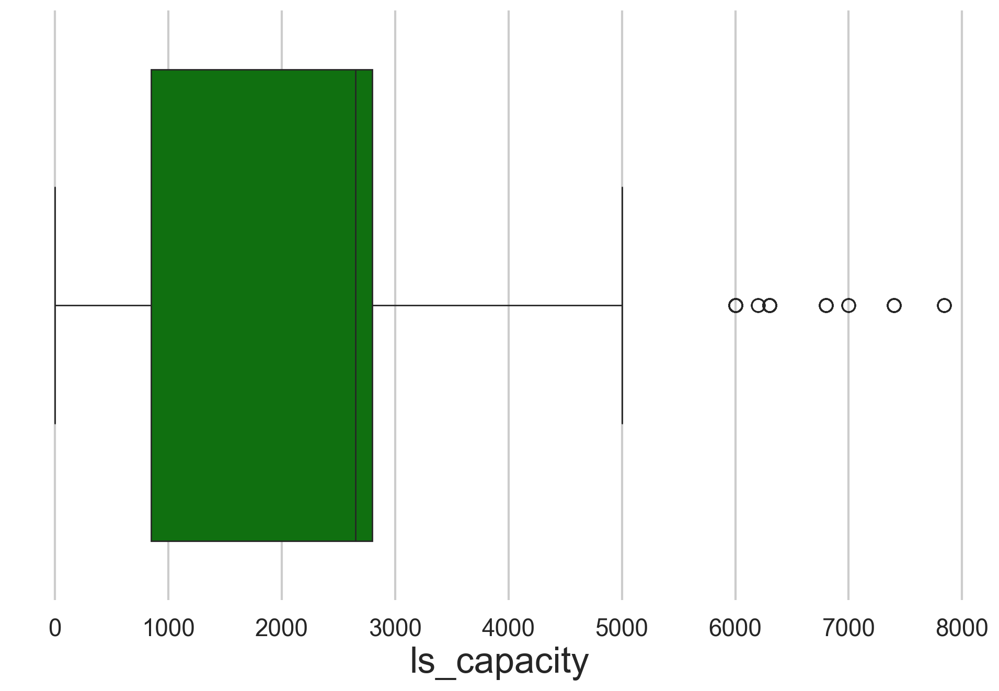

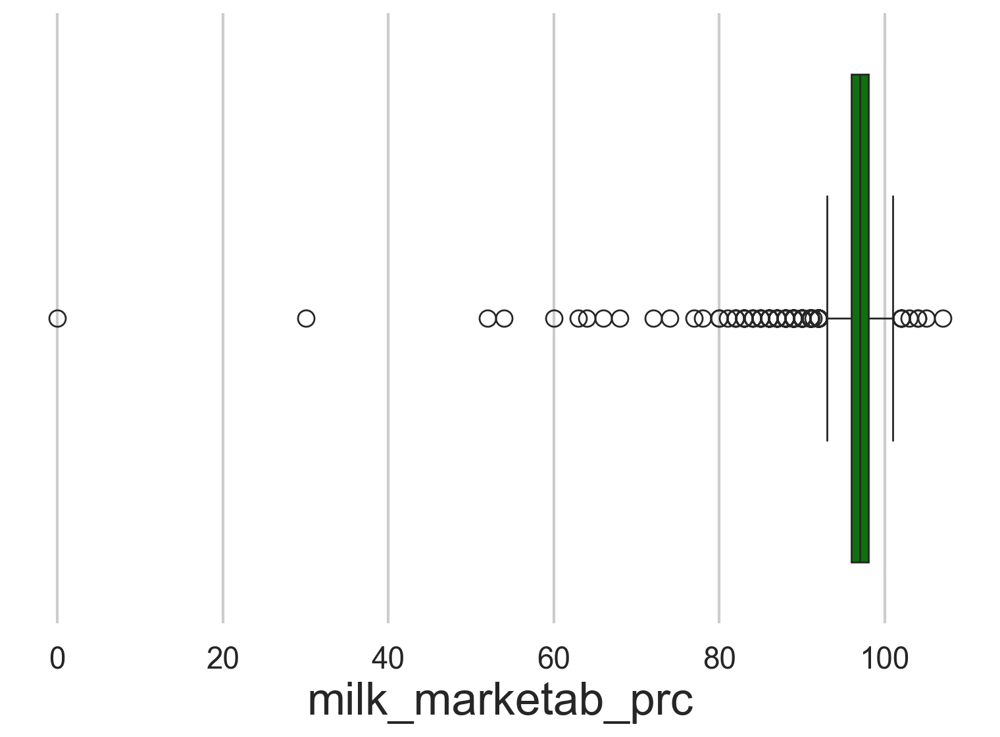

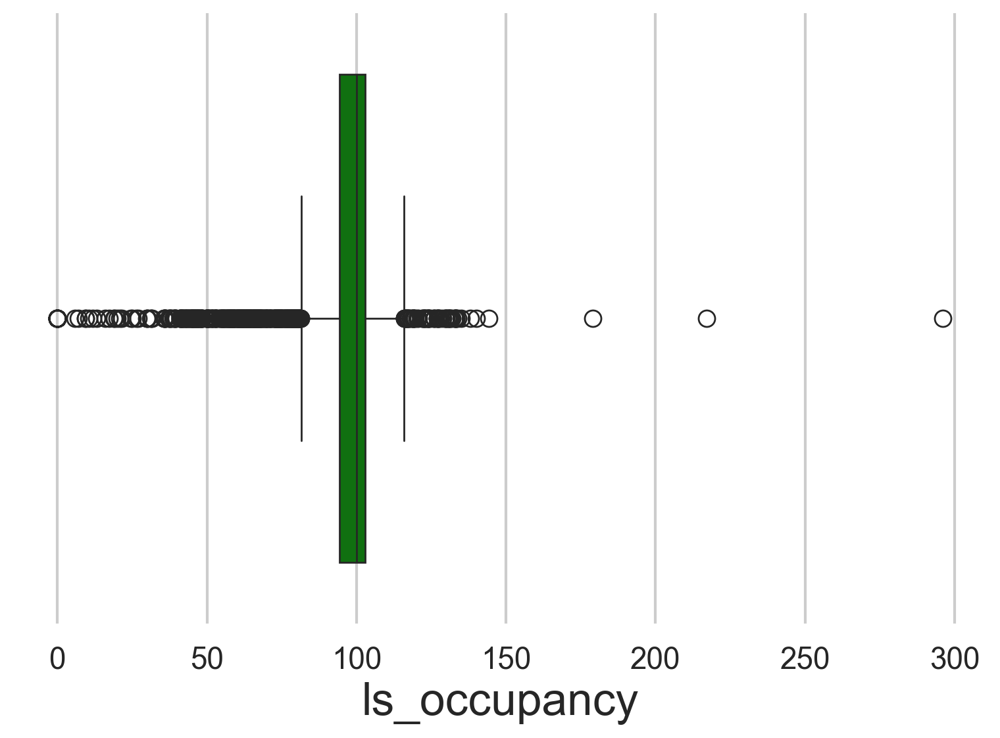

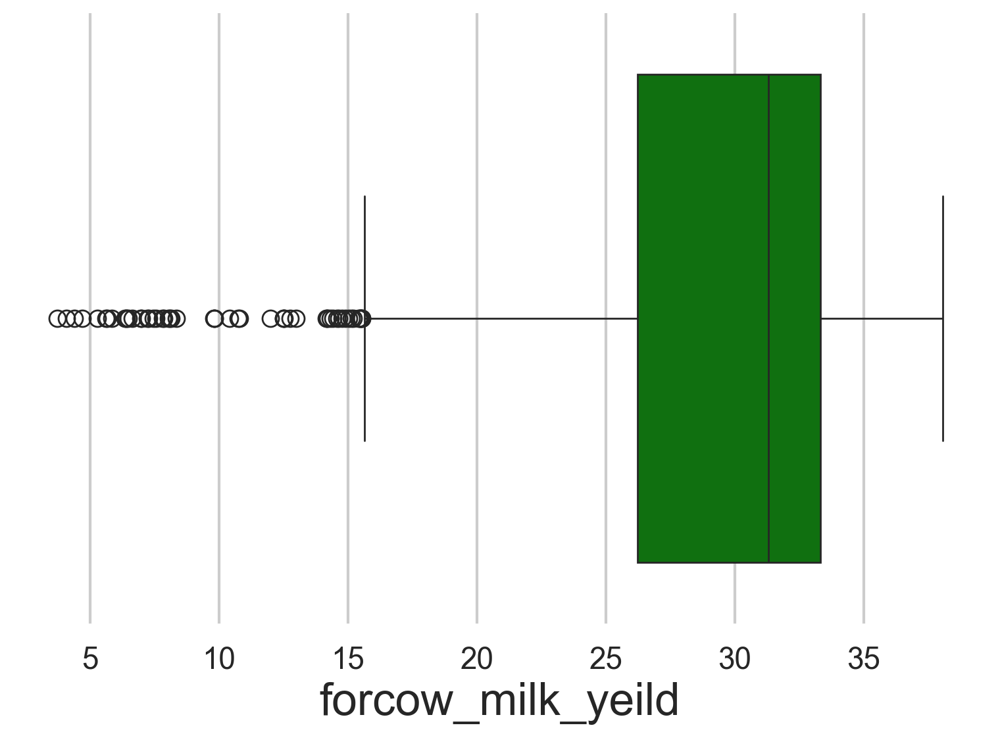

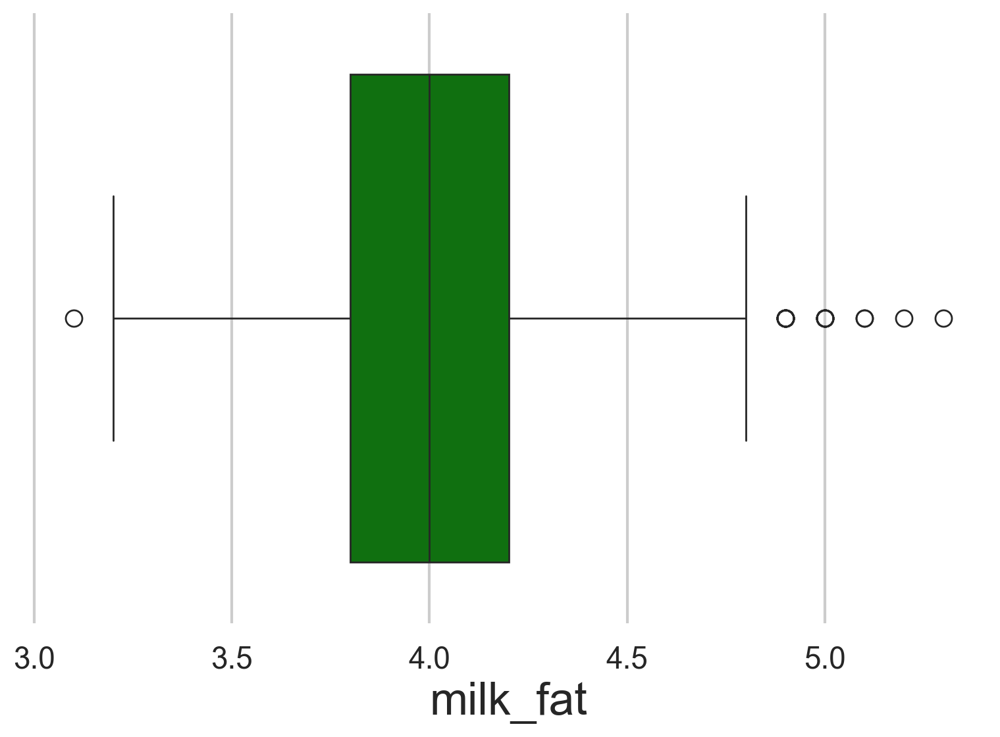

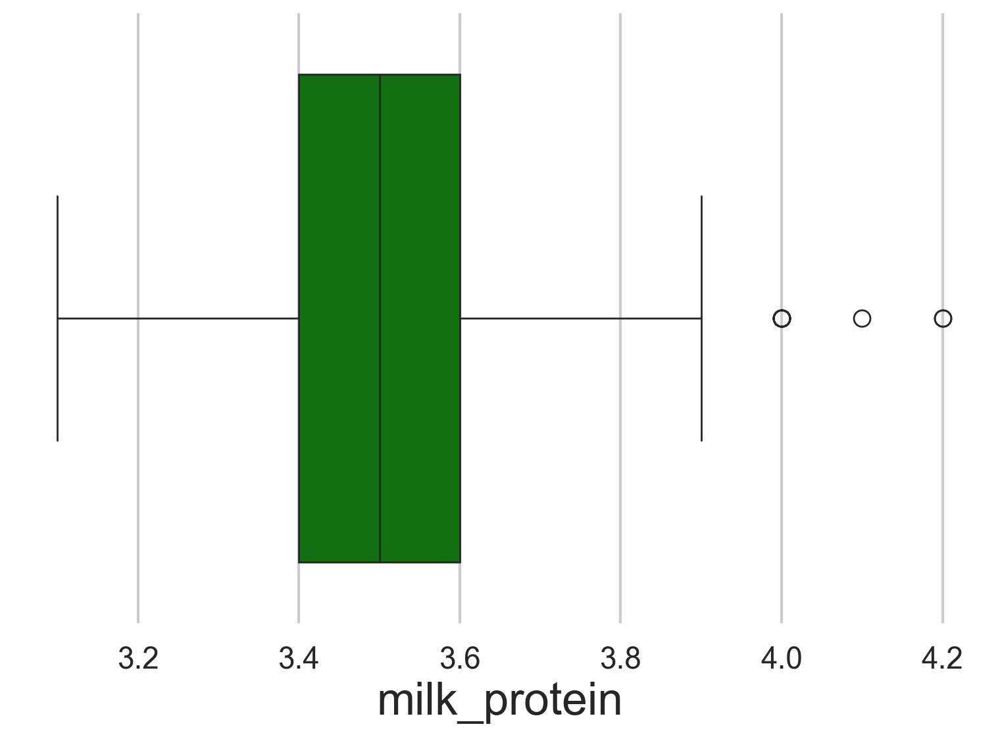

In [107]:
plt.figure(figsize=(10,7))
for k in ['ls_capacity', 'milk_marketab_prc', 'ls_occupancy', 'forcow_milk_yeild', 'milk_fat', 'milk_protein']:
    sns.boxplot(data=herd_metrics, x=k, color='Green')
    plt.tight_layout()
    plt.show()

In [108]:
herd_metrics['month'] = herd_metrics['date'].dt.month
over_100 = herd_metrics[herd_metrics['ls_occupancy'] > 100]
over_100.shape


(1673, 27)

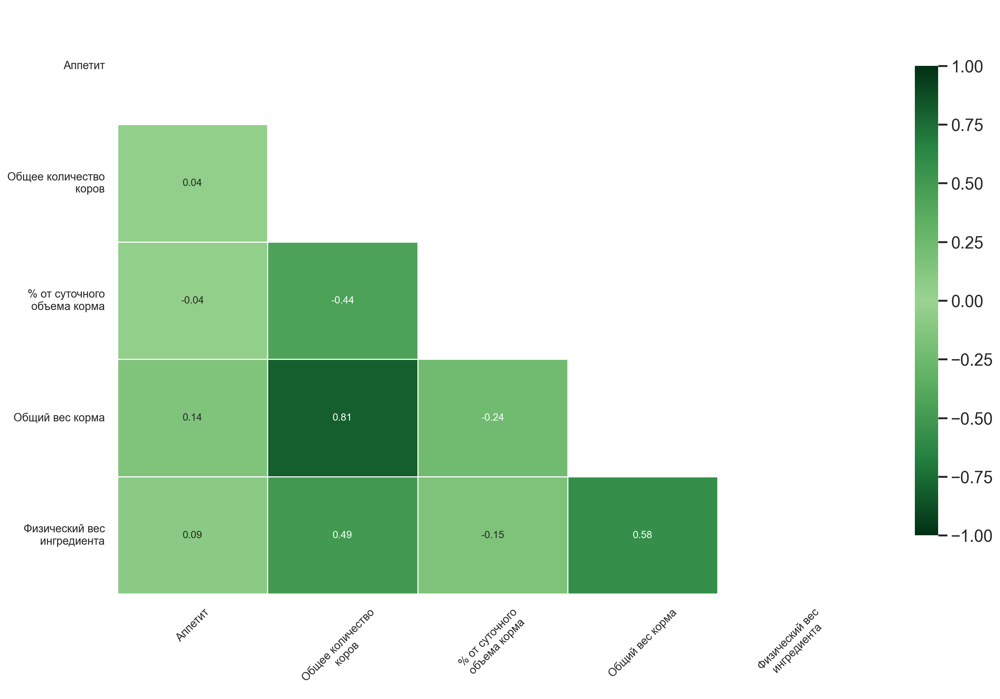

In [ ]:
import textwrap
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
plt.figure(figsize=(15,10))
custom_greens_sym = ["#003014", "#258241", "#5fb162", "#9ad390", '#5fb162', '#258241', '#003014']
to_rus = {
    "Appetite": 'Аппетит',
    'PhysiologicalGroupHeadCount': 'Общее количество коров',
    'RationPart': '% от суточного объема корма',
    'TotalWeight_kg': 'Общий вес корма',
    'PhysicalWeight_kg': 'Физический вес ингредиента', 
}
cmap = LinearSegmentedColormap.from_list("custom_green", custom_greens_sym)
cols = list(to_rus.keys())
corr = df[cols].corr(method='spearman')
corr = corr.rename(index=to_rus, columns=to_rus)
def wrap_labels(labels, width=18):
    return ['\n'.join(textwrap.wrap(label, width)) for label in labels] #Ммм, вайбкодик
corr.index = wrap_labels(corr.index, width=18)
corr.columns = wrap_labels(corr.columns, width=18)
mask = corr.where(~np.triu(np.ones_like(corr, dtype=bool)))
cmap.set_bad(color="#b4eba9") 
norm = TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
ax = sns.heatmap(mask, annot=True, cmap=cmap, norm=norm, fmt='.2f', annot_kws={"size": 10}, cbar_kws={"shrink": 0.8}, linewidths=1, linecolor='white')
ax.set_facecolor('white')
plt.xticks(rotation=45, fontsize=11)
plt.yticks(rotation=0, fontsize=11)
plt.tight_layout()
plt.show()

In [110]:
monthly_feeding = pd.read_excel("datasets/Ekoniva_dataset.xlsx", sheet_name="Feeding (monthly)", header=1, skiprows=[2])
monthly_feeding = monthly_feeding[monthly_feeding['physiological_group_name'].isin(['Д0 (Новотельные)', 'Д1', 'Д2', 'Д3 (Предзапуск)', 'С1', 'С2'])]
month_cols = monthly_feeding.columns[4:]

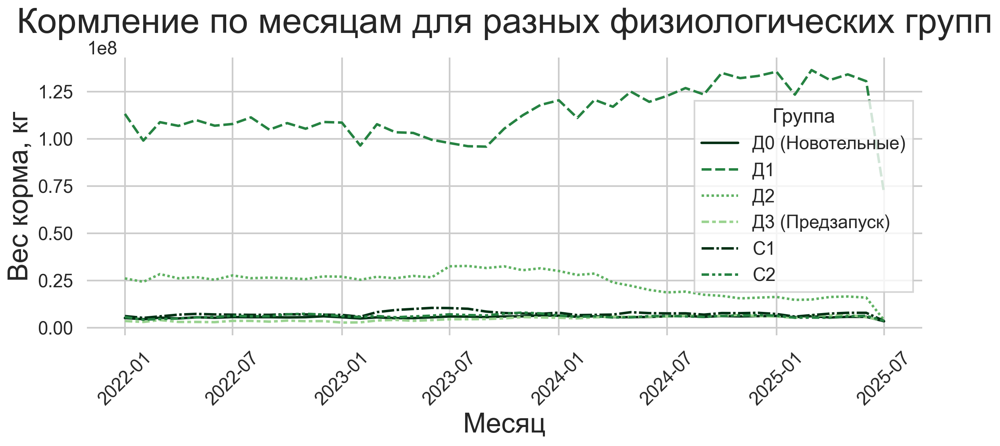

In [119]:
group_month = monthly_feeding.groupby('physiological_group_name')[month_cols].sum().T
custom_greens = ["#003014", "#258241", "#5fb162", "#9ad390"]
plt.figure(figsize=(12,6))
sns.lineplot(data=group_month,ax=plt.gca(), palette=custom_greens)
plt.title("Кормление по месяцам для разных физиологических групп")
plt.xlabel("Месяц")
plt.ylabel("Вес корма, кг")
plt.xticks(rotation=45)
plt.legend(title="Группа")
plt.tight_layout()
plt.show()

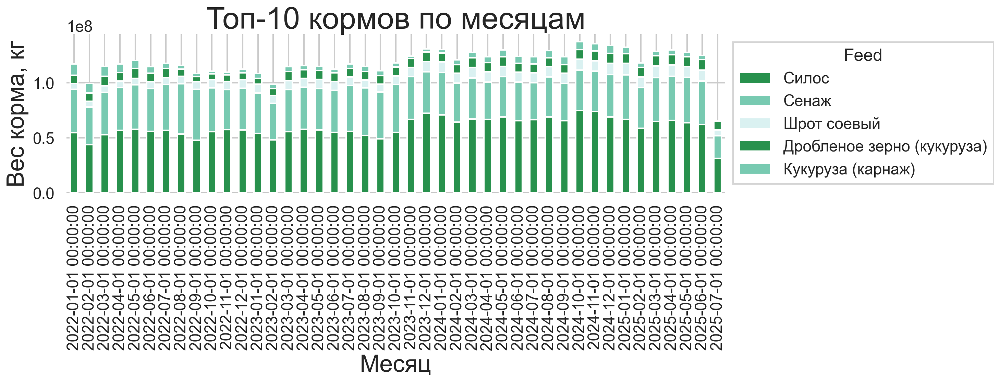

In [112]:
feed_sums = monthly_feeding.groupby('feed_name')[month_cols].sum().sum(axis=1)
top10_feeds = feed_sums.sort_values(ascending=False).head(5).index
feed_month = monthly_feeding.groupby('feed_name')[month_cols].sum().T
feed_month_top10 = feed_month[top10_feeds]
feed_month_top10.plot(kind='bar', stacked=True, figsize=(15,6))
plt.title("Топ-10 кормов по месяцам")
plt.xlabel("Месяц")
plt.ylabel("Вес корма, кг")
plt.legend(title="Feed", bbox_to_anchor=(1,1))
plt.tight_layout()
plt.show()


In [120]:
production_indicators.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1747 entries, 0 to 1746
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date                    1747 non-null   datetime64[ns]
 1   region                  1747 non-null   object        
 2   prod_farm_name          1747 non-null   object        
 3   farm_type               1747 non-null   object        
 4   farm_name               1747 non-null   object        
 5   cows_total              1741 non-null   float64       
 6   milk_cows               1741 non-null   float64       
 7   milk_cows_d0            1741 non-null   float64       
 8   milk_cows_d1            1741 non-null   float64       
 9   milk_cows_d2            1741 non-null   float64       
 10  milk_cows_d3            1741 non-null   float64       
 11  weekly_milking_per_cow  1298 non-null   float64       
 12  gross_milk_yield        840 non-null    float64 

In [129]:
production_indicators['month'] = production_indicators['date_month'].dt.month
production_indicators['year'] = production_indicators['date_month'].dt.year

In [133]:
gb = production_indicators.groupby(['date_month', 'region'])['milk_cows_d0'].mean().reset_index()
gb

,date_month,region,milk_cows_d0
0,2022-12-01,Воронеж,74.956522
1,2022-12-01,Калуга,63.363636
2,2022-12-01,Курск,45.000000
3,2022-12-01,МоПеТю,90.250000
4,2022-12-01,Поволжье,109.500000
...,...,...,...
202,2025-07-01,Калуга,79.000000
203,2025-07-01,МоПеТю,70.500000
204,2025-07-01,Поволжье,127.000000
205,2025-07-01,Рязань,72.500000


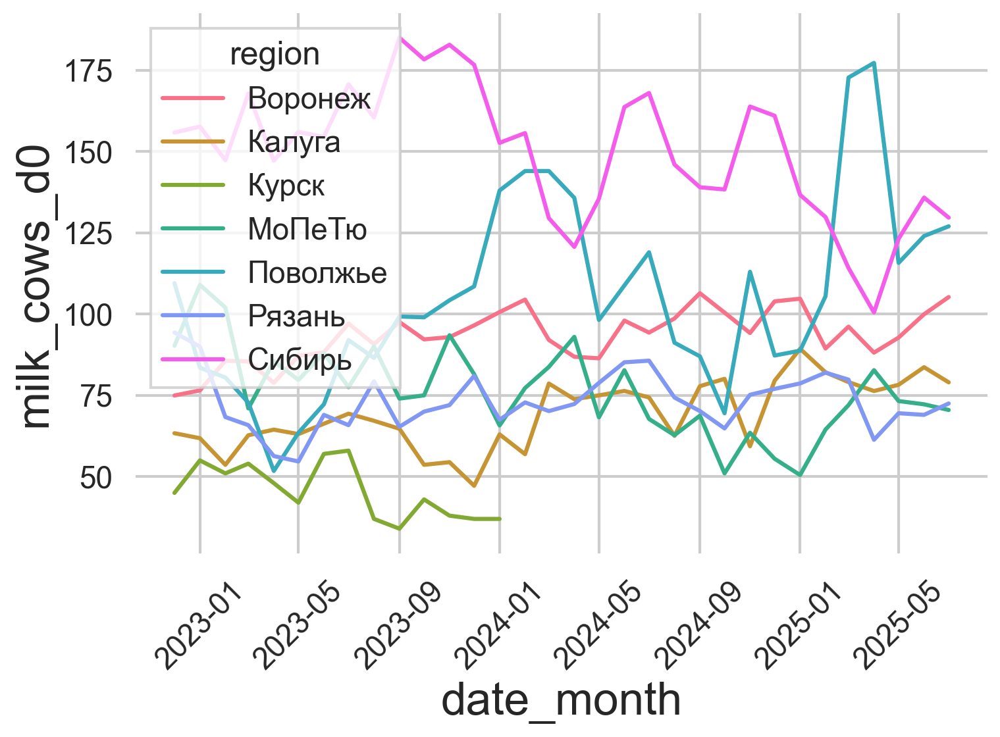

In [135]:
sns.lineplot(data=gb, x='date_month', y='milk_cows_d0', hue='region')
plt.xticks(rotation=45)
plt.show()

<Axes: xlabel='milk_fat', ylabel='Count'>

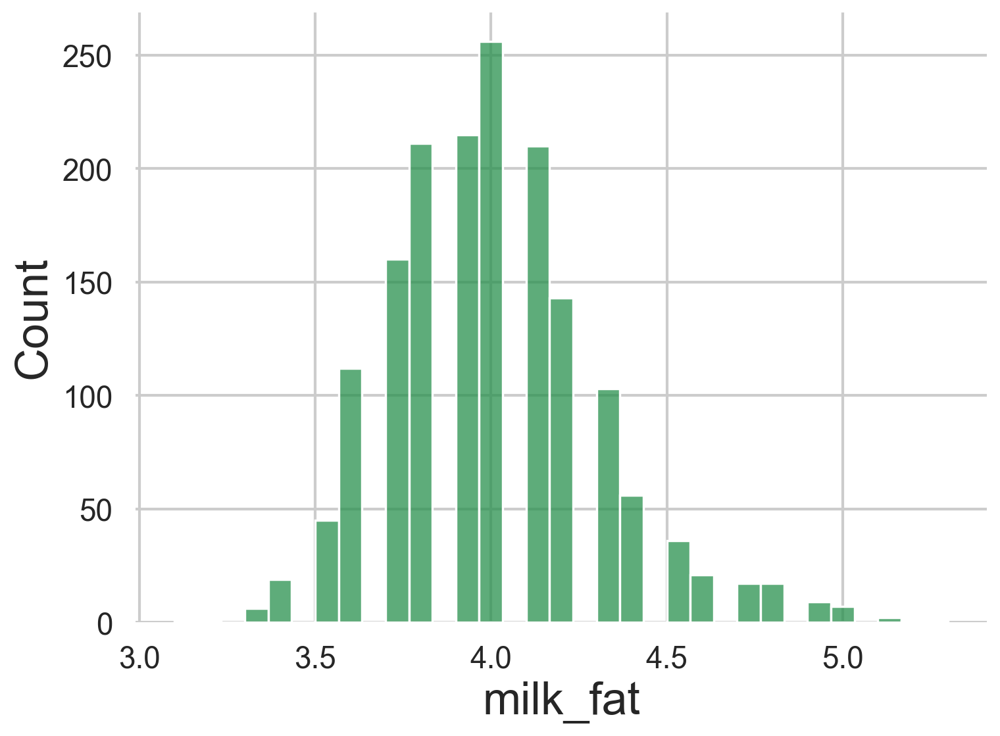

In [138]:
sns.histplot(data=herd_metrics, x='milk_fat')